# **ABSTRACTO**

**MOTIVACION**

La motivación principal para realizar este proyecto es poder, a través del análisis de datos y el uso de modelos predictivos, poder predecir cuándo lloverá. En el caso de nuestro proyecto en las distintas ciudades que componen los estados de Australia

**AUDIENCIA**

Aquellos interesados en conocer que tan viable y certero es el análisis de datos para predecir fenómenos climáticos. Abarcando desde estudiantes de Ciencia de datos, que como en nuestro caso, buscan acercarse a esta a herramienta y conocer su funcionamiento, como aquellos que trabajan considerando las variables climáticas, o bien, deben conocer las mismas para tomar algún tipo de decisión

# **PREGUNTAS**

Al ver las variables a analizar surgieron las siguientes preguntas con respecto a la posibilidad de lluvias:

* ¿Cuanto más nublado está el cielo, más probable es que llueva?
* ¿A mayor humedad, es más probable que llueva?
* ¿Cuanto más baja es la presión atmosférica, es más probable que llueva?
* ¿Qué sucede con la presión atmosférica al haber vientos fuertes? 
* Al combinarse las variables analizadas ¿Habrá más o menos lluvias?

Esto finalmente lleva a preguntarse:
* ¿Cuáles son las ciudades con más lluvias? ¿En ellas se cumplen las condiciones anteriores?











# **ANALISIS EXPLORATORIO DE DATOS (EDA)**


In [ ]:
import numpy as np 
import pandas as pd 
import missingno as msno
from math import floor
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import re
import io
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set_theme()

In [ ]:
pip install --upgrade scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

In [ ]:
pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Importamos los datasets a utilizar

In [ ]:
from google.colab import drive
drive.mount('/DATA_SCIENCE')


Mounted at /DATA_SCIENCE


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/weatherAUS.csv')
coordenadas = pd.read_excel('/content/Latitudes.xlsx')

In [ ]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


**¿Cuanto más nublado está el cielo, más probable es que llueva?**

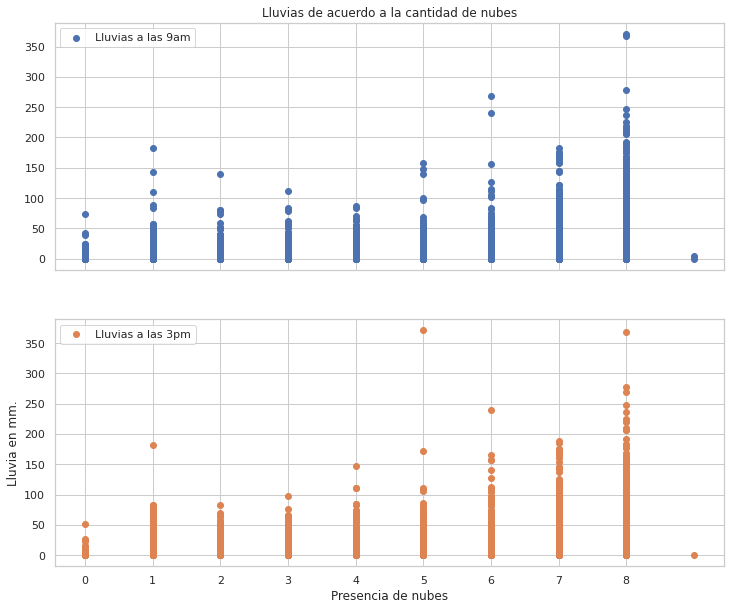

In [ ]:
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10), sharex=True, sharey=True)  
ax[0].scatter(df['Cloud9am'],df['Rainfall'], label='Lluvias a las 9am')
ax[1].scatter(df['Cloud3pm'],df['Rainfall'], label='Lluvias a las 3pm', color='C1')
ax[0].set_title('Lluvias de acuerdo a la cantidad de nubes') 
ax[1].set_xlabel('Presencia de nubes')  
ax[1].set_ylabel('Lluvia en mm.')
plt.xticks(np.arange(0, 9, step=1))

ax[0].legend()  
ax[1].legend()

Se puede observar en el grafico que la mayor ocurrencia de lluvias se da a mayor nubosidad. Ademas se observa que a hay ocurrencia de lluvias a nubosidad 0, lo que puede deberse a diversos fenomenos climaticos tales como la transicion entre la estacion lluviosa a la seca, durante el período de transición de la temporada de lluvias, el sol brilla sobre la tierra, porque la radiación del sol es óptima, por lo que su evaporación es óptima tambien.Estas nubes formadoras de lluvia son pocas y no cubren el cielo para que aún se pueda ver el sol.Por lo general, ocurre durante el día cuando el sol está muy caliente. Los fuertes vientos pueden influir en este fenomeno ya que esta lluvia puede estar formada por el movimiento del viento que arrastra las gotas de agua que provienen de las tormentas de otras zonas.Estas gotas de lluvia finalmente caen sobre su área que se ve soleada con pocas nubes.

Tambien se puede observar que la diferencia horaria no es un factor que modifique la cantidad de lluvias ya que la cantidad de lluvias es similar entre ambos graficos

**¿A mayor humedad, es más probable que llueva?**

Text(0.5, 0, 'Humedad a las 15 horas')

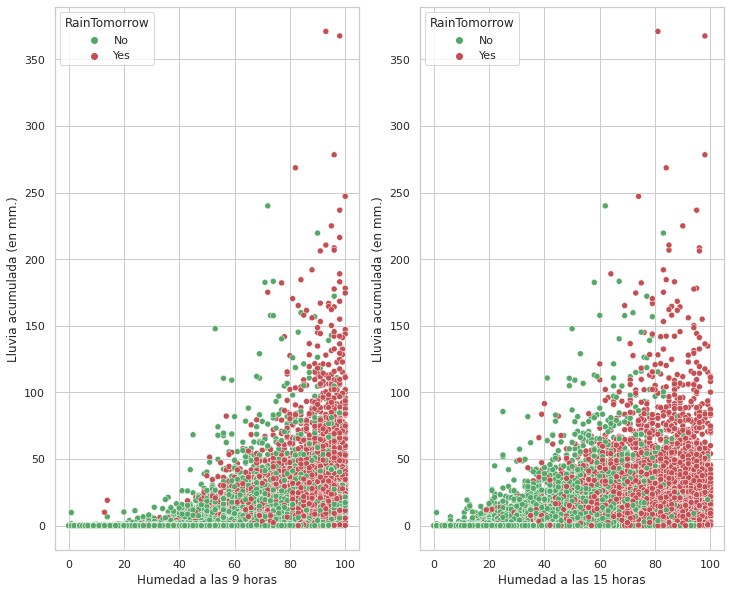

In [ ]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,10))
sns.scatterplot(data=df, x="Humidity9am", y="Rainfall", hue="RainTomorrow", palette=['g', 'r'], ax = ax1)
sns.scatterplot(data=df, x="Humidity3pm", y="Rainfall", hue="RainTomorrow", palette=['g', 'r'], ax = ax2)
ax1.set_ylabel('Lluvia acumulada (en mm.)', fontsize=12)
ax2.set_ylabel('Lluvia acumulada (en mm.)', fontsize=12)
ax1.set_xlabel('Humedad a las 9 horas', fontsize=12)
ax2.set_xlabel('Humedad a las 15 horas', fontsize=12)

El grafico permite visualizar que a mayor humedad, mayor sera el caudal de lluvia en milimetros. Tambien se destaca que hay mas probabilidad de que llueva mayor cantidad de milimetros por la tarde, en presencia de valores medios/bajos de humedad.

Este fenomeno se presenta en menor medida a las 9am y responde a la marcha horaria de la temperatura que afecta a la presión de vapor de agua que existe en la atmósfera. Esto lleva a que, por ejemplo, en verano las mañanas se sientan pesadas pero no esten marcadas por una humedad elevada

**Hablando de presion atmosferica, es interesante analizar la relacion entre ella y la humedad a la hora de producirse las lluvias.**

Text(0.5, 0, 'Humedad a las 9 horas')

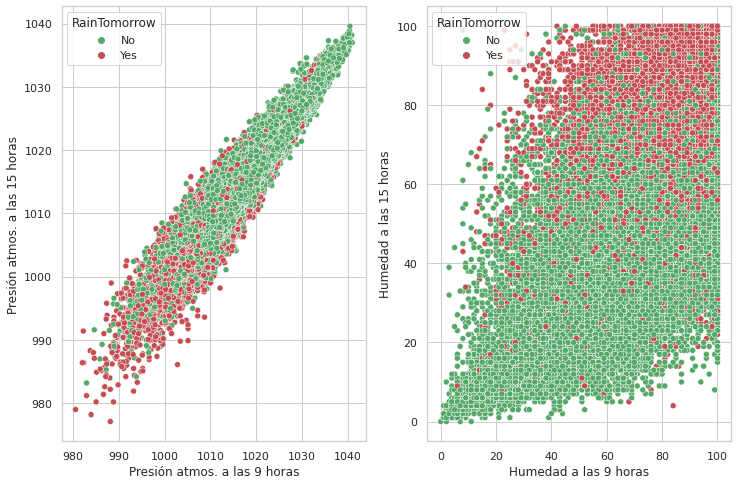

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))
sns.scatterplot(x='Pressure9am', y='Pressure3pm', data=df, hue='RainTomorrow', palette=['g', 'r'], ax=axes[0])
sns.scatterplot(x='Humidity9am', y='Humidity3pm', data=df, hue='RainTomorrow', palette=['g', 'r'],ax=axes[1])
axes[0].set_ylabel('Presión atmos. a las 15 horas', fontsize=12)
axes[0].set_xlabel('Presión atmos. a las 9 horas', fontsize=12)
axes[1].set_ylabel('Humedad a las 15 horas', fontsize=12)
axes[1].set_xlabel('Humedad a las 9 horas', fontsize=12)

Se observa que hay mas chances de que llueva cuando la humedad es alta y la presion es baja. Esto es asi debido a que cuando la presion atmosferica es baja nos encontramos con más humedad en la zona, así como mayor nubosidad ya que las bajas presiones permiten la formación de nubes.

**¿Que incidencia tiene la presencia de fuertes vientos?**


Text(0.5, 0, 'Velocidad del viento')

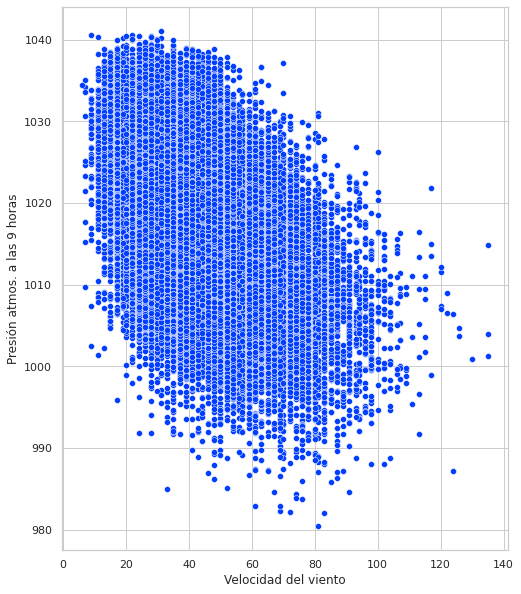

In [ ]:
sns.set_palette("bright")
fig, ax = plt.subplots(figsize=(8, 10))
sns.scatterplot(data=df, y="Pressure9am", x="WindGustSpeed")
ax.set_ylabel('Presión atmos. a las 9 horas', fontsize=12)
ax.set_xlabel('Velocidad del viento', fontsize=12)

**Al combinarse las variables analizadas ¿Habrá más o menos lluvias?**

Text(0.5, 0, 'Velocidad del viento')

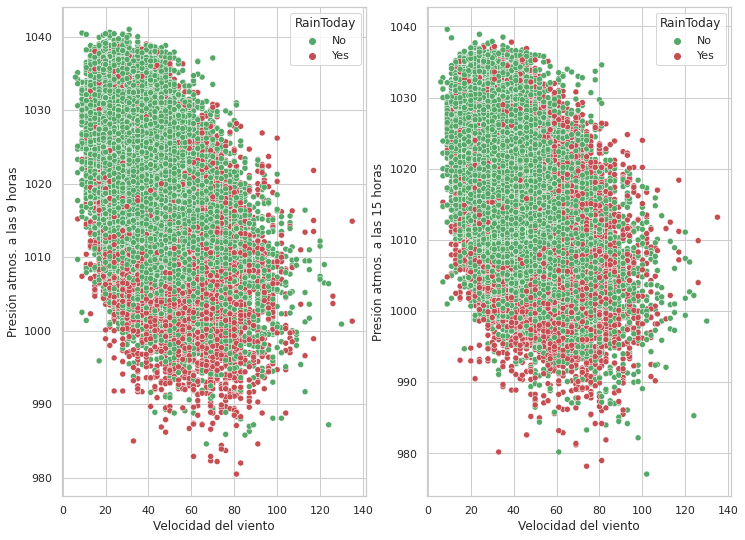

In [ ]:
sns.color_palette("bright")
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,9))
sns.scatterplot(data=df, x="WindGustSpeed", y="Pressure9am", hue="RainToday", palette=['g', 'r'], ax = ax1)
sns.scatterplot(data=df, x="WindGustSpeed", y="Pressure3pm", hue="RainToday", palette=['g', 'r'], ax = ax2)
ax1.set_ylabel('Presión atmos. a las 9 horas', fontsize=12)
ax2.set_ylabel('Presión atmos. a las 15 horas', fontsize=12)
ax1.set_xlabel('Velocidad del viento', fontsize=12)
ax2.set_xlabel('Velocidad del viento', fontsize=12)

En el grafico se puede ver lo explicado en el grafico anterior: La baja presion atmosferica sumada a vientos lentos o normales tirando a lento son un factor importante para que se produzcan o no lluvias.

La variacion del dia dea la presion atmosferica es llamada variación diurna y consiste en una doble oscilación en 24 horas, con mínimos hacia las cuatro de la madrugada y cuatro de la tarde y máximos a las diez y veintidós horas, es decir, que el barómetro sube desde las cuatro de la madrugada hasta las diez de la mañana; baja hasta las cuatro de la tarde; vuelve a subir hasta las diez de la noche y de nuevo, desciende hasta las cuatro de la madrugada. Es por ello que se pueden observar una mayor cantidad de dias con presiones superiores a 1030 a las 9am que a las 3pm

**¿Cuáles son las ciudades con más lluvias? ¿En ellas se cumplen las condiciones anteriores?**

Vamos a utilizar el Dataset "Latitudes" para incoporar los valores de "Lat" y "Lon" que faltaban. Para ello vamos a unir los dos datasets por la variable "Location" 

In [ ]:
coordenadas


,Location,Lat,Lon
0,Adelaide,-34.921230,138.599503
1,Albany,-35.022778,117.881386
2,Albury,-36.080780,146.916473
3,Ararat,-37.283333,142.916672
4,Armadale,-32.153057,116.014999
...,...,...,...
83,Warrnambool,-38.383331,142.483337
84,Westmead,-33.807690,150.987274
85,Whyalla,-33.033333,137.566666
86,Wollongong,-34.425072,150.893143


In [ ]:
result = pd.merge(df,coordenadas, on="Location")
result

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Lat,Lon
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,-36.080780,146.916473
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,-36.080780,146.916473
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,-36.080780,146.916473
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,-36.080780,146.916473
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,-36.080780,146.916473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59309,2017-06-21,Darwin,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,...,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No,-12.462827,130.841782
59310,2017-06-22,Darwin,20.7,32.8,0.0,5.6,11.0,E,33.0,E,...,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No,-12.462827,130.841782
59311,2017-06-23,Darwin,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,...,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No,-12.462827,130.841782
59312,2017-06-24,Darwin,20.2,31.7,0.0,5.6,10.7,ENE,30.0,ENE,...,1013.9,1009.7,6.0,5.0,25.4,31.0,No,No,-12.462827,130.841782


In [ ]:
type(result)

pandas.core.frame.DataFrame

In [ ]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59314 entries, 0 to 59313
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           59314 non-null  object 
 1   Location       59314 non-null  object 
 2   MinTemp        58338 non-null  float64
 3   MaxTemp        58459 non-null  float64
 4   Rainfall       58029 non-null  float64
 5   Evaporation    34182 non-null  float64
 6   Sunshine       32288 non-null  float64
 7   WindGustDir    51287 non-null  object 
 8   WindGustSpeed  51296 non-null  float64
 9   WindDir9am     54231 non-null  object 
 10  WindDir3pm     56553 non-null  object 
 11  WindSpeed9am   58624 non-null  float64
 12  WindSpeed3pm   57279 non-null  float64
 13  Humidity9am    58246 non-null  float64
 14  Humidity3pm    56960 non-null  float64
 15  Pressure9am    51206 non-null  float64
 16  Pressure3pm    51236 non-null  float64
 17  Cloud9am       41038 non-null  float64
 18  Cloud3

In [ ]:
import folium
from folium.plugins import HeatMap

In [ ]:
result.isnull().sum()

Date                 0
Location             0
MinTemp            976
MaxTemp            855
Rainfall          1285
Evaporation      25132
Sunshine         27026
WindGustDir       8027
WindGustSpeed     8018
WindDir9am        5083
WindDir3pm        2761
WindSpeed9am       690
WindSpeed3pm      2035
Humidity9am       1068
Humidity3pm       2354
Pressure9am       8108
Pressure3pm       8078
Cloud9am         18276
Cloud3pm         20109
Temp9am            889
Temp3pm           2240
RainToday         1285
RainTomorrow      1286
Lat                  0
Lon                  0
dtype: int64

Como podemos ver, ya no hay nulos en "Lat" y "Lon"

In [ ]:
ciudades = result[['Location','Lat','Lon']]
ciudades

,Location,Lat,Lon
0,Albury,-36.080780,146.916473
1,Albury,-36.080780,146.916473
2,Albury,-36.080780,146.916473
3,Albury,-36.080780,146.916473
4,Albury,-36.080780,146.916473
...,...,...,...
59309,Darwin,-12.462827,130.841782
59310,Darwin,-12.462827,130.841782
59311,Darwin,-12.462827,130.841782
59312,Darwin,-12.462827,130.841782


In [ ]:
result['Location'].unique()

array(['Albury', 'Newcastle', 'Penrith', 'Sydney', 'Wollongong',
       'Canberra', 'Ballarat', 'Bendigo', 'Sale', 'Melbourne', 'Mildura',
       'Brisbane', 'Cairns', 'Adelaide', 'Albany', 'Perth', 'Hobart',
       'Launceston', 'Darwin'], dtype=object)

In [ ]:
ciudades['Location'].unique()

array(['Albury', 'Newcastle', 'Penrith', 'Sydney', 'Wollongong',
       'Canberra', 'Ballarat', 'Bendigo', 'Sale', 'Melbourne', 'Mildura',
       'Brisbane', 'Cairns', 'Adelaide', 'Albany', 'Perth', 'Hobart',
       'Launceston', 'Darwin'], dtype=object)

In [ ]:
lluvias= result[['Rainfall']].groupby(result['Location']).sum()
lluvias

,Rainfall
Location,
Adelaide,4841.6
Albany,6827.8
Albury,5763.4
Ballarat,5268.8
Bendigo,4913.2
Brisbane,9941.0
Cairns,17157.2
Canberra,5953.2
Darwin,16260.2


In [ ]:
ciudades_lluvias = pd.merge(ciudades,lluvias, on="Location")
ciudades_lluvias

,Location,Lat,Lon,Rainfall
0,Albury,-36.080780,146.916473,5763.4
1,Albury,-36.080780,146.916473,5763.4
2,Albury,-36.080780,146.916473,5763.4
3,Albury,-36.080780,146.916473,5763.4
4,Albury,-36.080780,146.916473,5763.4
...,...,...,...,...
59309,Darwin,-12.462827,130.841782,16260.2
59310,Darwin,-12.462827,130.841782,16260.2
59311,Darwin,-12.462827,130.841782,16260.2
59312,Darwin,-12.462827,130.841782,16260.2


In [ ]:
max_amount = float(ciudades_lluvias['Rainfall'].max())

folium_hmap = folium.Map(location=[-25.27,133.77],
                        zoom_start=4,
                        tiles="OpenStreetMap")

hm_wide = HeatMap(list(zip(ciudades_lluvias['Lat'], ciudades_lluvias['Lon'], ciudades_lluvias['Rainfall'])),
                   min_opacity=0.8,
                   max_val=max_amount,
                   radius=10, blur=6, 
                   max_zoom=15,
                  )
folium_hmap.add_child(hm_wide)


Puede verse a simple vista que las ciudades costeras son las que resaltan por sobre el resto en cantidad de lluvias.

# **INGENIERIA DE ATRIBUTOS**

# Valores nulos



In [ ]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59314 entries, 0 to 59313
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           59314 non-null  object 
 1   Location       59314 non-null  object 
 2   MinTemp        58338 non-null  float64
 3   MaxTemp        58459 non-null  float64
 4   Rainfall       58029 non-null  float64
 5   Evaporation    34182 non-null  float64
 6   Sunshine       32288 non-null  float64
 7   WindGustDir    51287 non-null  object 
 8   WindGustSpeed  51296 non-null  float64
 9   WindDir9am     54231 non-null  object 
 10  WindDir3pm     56553 non-null  object 
 11  WindSpeed9am   58624 non-null  float64
 12  WindSpeed3pm   57279 non-null  float64
 13  Humidity9am    58246 non-null  float64
 14  Humidity3pm    56960 non-null  float64
 15  Pressure9am    51206 non-null  float64
 16  Pressure3pm    51236 non-null  float64
 17  Cloud9am       41038 non-null  float64
 18  Cloud3

- Tenemos 25 columnas ahora en el dataset y 59314 rows.
- Podemos ver que hay variables categoricas y numericas
- Hay datos nulos en todas las columnas (menos en date,lat y lon que fueron las que estuvimos trabajando)

In [ ]:
result.isnull().sum()

Date                 0
Location             0
MinTemp            976
MaxTemp            855
Rainfall          1285
Evaporation      25132
Sunshine         27026
WindGustDir       8027
WindGustSpeed     8018
WindDir9am        5083
WindDir3pm        2761
WindSpeed9am       690
WindSpeed3pm      2035
Humidity9am       1068
Humidity3pm       2354
Pressure9am       8108
Pressure3pm       8078
Cloud9am         18276
Cloud3pm         20109
Temp9am            889
Temp3pm           2240
RainToday         1285
RainTomorrow      1286
Lat                  0
Lon                  0
dtype: int64

In [ ]:
result.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Lat,Lon
count,58338.000000,58459.000000,58029.000000,34182.000000,32288.000000,51296.000000,58624.000000,57279.000000,58246.000000,56960.000000,51206.000000,51236.000000,41038.000000,39205.000000,58425.000000,57074.000000,59314.000000,59314.000000
mean,12.412817,22.977239,2.478209,5.093473,7.537522,38.944460,12.608215,17.814155,70.472015,52.596577,1017.276059,1014.958673,4.640674,4.632190,16.775967,21.499713,-33.340411,143.129215
std,6.514640,6.811968,8.920402,3.257884,3.695173,14.017353,8.868449,8.913661,17.056189,19.066937,7.442010,7.345587,2.843384,2.707496,6.542790,6.688634,7.228289,10.334028
min,-8.000000,4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,3.000000,1.000000,982.200000,977.100000,0.000000,0.000000,-2.300000,1.700000,-42.880554,115.857048
25%,7.800000,17.700000,0.000000,2.600000,4.900000,30.000000,6.000000,11.000000,59.000000,39.000000,1012.400000,1010.000000,2.000000,2.000000,12.000000,16.300000,-37.549999,142.136490
50%,12.100000,22.400000,0.000000,4.600000,8.300000,37.000000,11.000000,17.000000,71.000000,52.000000,1017.200000,1014.900000,6.000000,5.000000,16.400000,21.000000,-34.921230,146.916473
75%,17.200000,28.100000,0.800000,7.000000,10.500000,46.000000,19.000000,24.000000,83.000000,65.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.400000,-32.916668,150.705444
max,33.900000,46.900000,367.600000,44.400000,14.500000,130.000000,130.000000,83.000000,100.000000,100.000000,1040.900000,1039.600000,9.000000,8.000000,39.000000,46.200000,-12.462827,153.021072


El describe() nos sirve para ver las estadisticas de las variables numericas y excluye las variables string.

<Axes: >

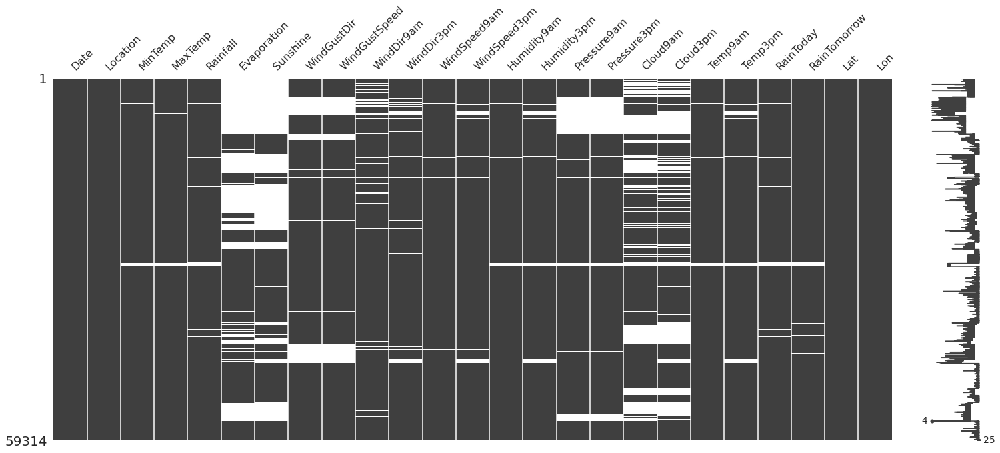

In [ ]:
import missingno as msno
msno.matrix(result)

<Axes: >

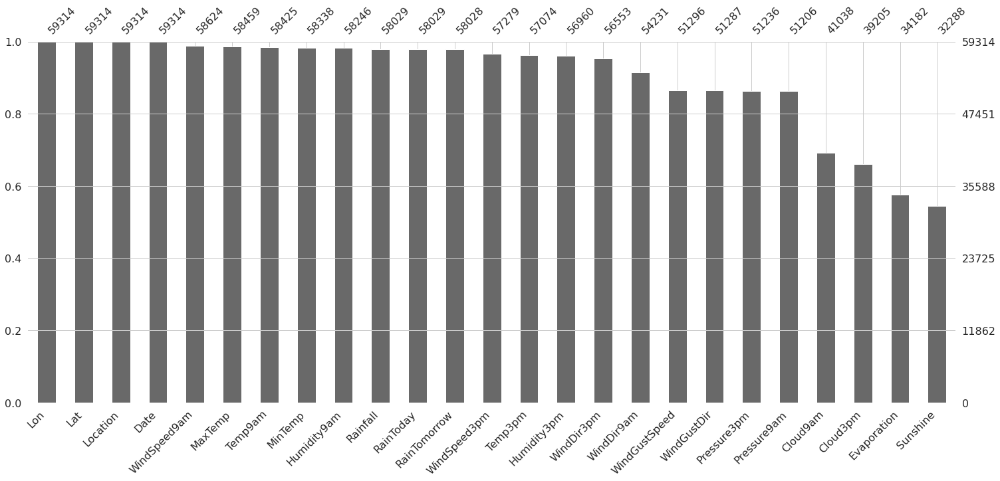

In [ ]:
msno.bar(result, sort= 'descending')

Podemos ver de los graficos que Cloud9am, Cloudpm3, Evaporation y Sushine son las variables con mas valores faltantes

En primer lugar, vamos a separar las variables en numericas y categoricas

In [ ]:
categorical = [i for i in result.columns if result[i].dtype=='object']
categorical

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [ ]:
numerical = [i for i in result.columns if result[i].dtype=='float64']
numerical

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Lat',
 'Lon']

# **Variables categoricas: **

In [ ]:
result[categorical].isnull().sum()

Date               0
Location           0
WindGustDir     8027
WindDir9am      5083
WindDir3pm      2761
RainToday       1285
RainTomorrow    1286
dtype: int64

Vamos a convertir la variable Date para tener dias, meses y a;os.

In [ ]:
result['Date'] = pd.to_datetime(result['Date'])

In [ ]:
result['Day'] = result['Date'].dt.day
result.Day

0         1
1         2
2         3
3         4
4         5
         ..
59309    21
59310    22
59311    23
59312    24
59313    25
Name: Day, Length: 59314, dtype: int64

In [ ]:
result['Month'] = result['Date'].dt.month
result.Month

0        12
1        12
2        12
3        12
4        12
         ..
59309     6
59310     6
59311     6
59312     6
59313     6
Name: Month, Length: 59314, dtype: int64

In [ ]:
result['Year'] = result['Date'].dt.year
result.Year

0        2008
1        2008
2        2008
3        2008
4        2008
         ... 
59309    2017
59310    2017
59311    2017
59312    2017
59313    2017
Name: Year, Length: 59314, dtype: int64

In [ ]:
result.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Lat,Lon,Day,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,NaN,16.9,21.8,No,No,-36.08078,146.916473,1,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,NaN,17.2,24.3,No,No,-36.08078,146.916473,2,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,2.0,21.0,23.2,No,No,-36.08078,146.916473,3,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,NaN,18.1,26.5,No,No,-36.08078,146.916473,4,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,8.0,17.8,29.7,No,No,-36.08078,146.916473,5,12,2008


In [ ]:
result.WindGustDir.unique()

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', nan, 'ENE',
       'SSE', 'S', 'NW', 'SE', 'ESE', 'E', 'SSW'], dtype=object)

Tenemos 16 valores distintos y los NaN.

In [ ]:
result.WindGustDir.value_counts()

W      4074
SE     4000
N      3924
NW     3896
SSE    3775
NNW    3550
WNW    3385
WSW    3184
S      3050
SW     3026
E      2893
SSW    2676
ESE    2643
NE     2552
ENE    2389
NNE    2270
Name: WindGustDir, dtype: int64

Vamos a reemplazar los valores NaN por el valor mas frecuente.

In [ ]:
result['WindGustDir'].fillna(result['WindGustDir'].mode()[0], inplace=True)

In [ ]:
result.WindGustDir.isnull().sum()

0

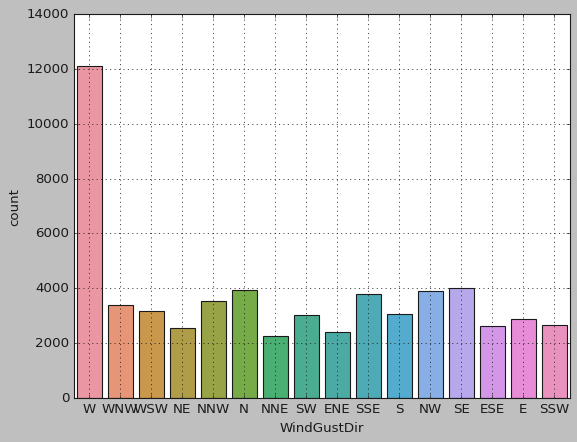

In [ ]:
plt.style.use("classic")
sns.countplot(data=result, x="WindGustDir")
plt.grid(linewidth = 0.7)
plt.show()

In [ ]:
result.WindDir9am.unique()

array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', nan, 'SSW', 'N',
       'WSW', 'ESE', 'E', 'NW', 'WNW', 'NNE'], dtype=object)

Tenemos 16 valores distintos y los NaN.

In [ ]:
result.WindDir9am.value_counts()

SSE    4728
N      4664
SE     4351
W      4064
S      3937
NNW    3766
NW     3642
SW     3389
SSW    3108
NNE    2974
E      2828
WNW    2820
NE     2770
ESE    2542
WSW    2493
ENE    2155
Name: WindDir9am, dtype: int64

In [ ]:
result['WindDir9am'].fillna(result['WindDir9am'].mode()[0], inplace=True)

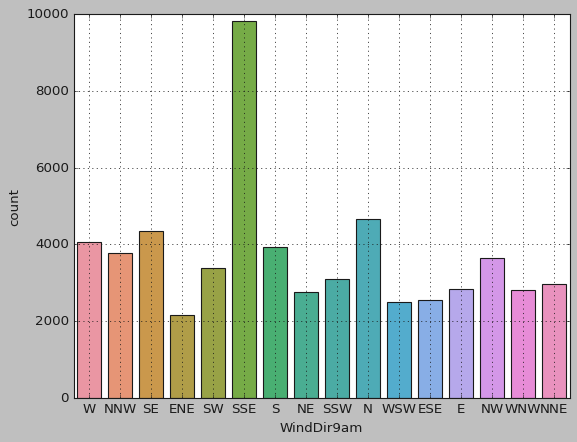

In [ ]:
plt.style.use("classic")
sns.countplot(data=result, x="WindDir9am")
plt.grid(linewidth = 0.7)
plt.show()

In [ ]:
result.WindDir3pm.unique()

array(['WNW', 'WSW', 'E', 'NW', 'W', 'SSE', 'ESE', 'ENE', 'NNW', 'SSW',
       'SW', 'SE', 'N', 'S', 'NNE', nan, 'NE'], dtype=object)

In [ ]:
result.WindDir3pm.value_counts()

SE     4943
NW     4455
NNW    4200
W      3933
N      3748
WNW    3661
WSW    3661
ESE    3473
SW     3461
S      3425
E      3389
SSE    3270
NE     3252
SSW    2750
ENE    2479
NNE    2453
Name: WindDir3pm, dtype: int64

In [ ]:
result['WindDir3pm'].fillna(result['WindDir3pm'].mode()[0], inplace=True)

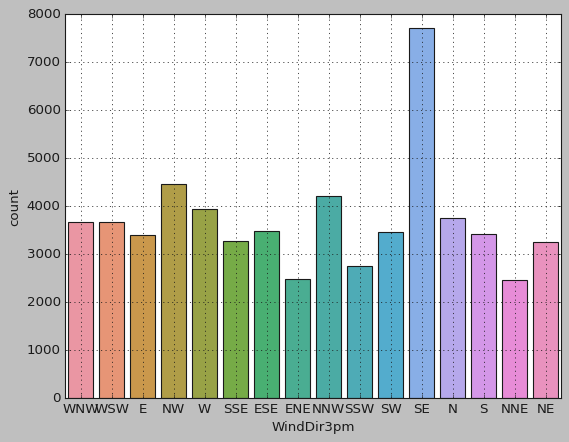

In [ ]:
plt.style.use("classic")
sns.countplot(data=result, x="WindDir3pm")
plt.grid(linewidth = 0.7)
plt.show()

In [ ]:
result.RainToday.unique()

array(['No', 'Yes', nan], dtype=object)

In [ ]:
result.RainToday.value_counts()

No     44720
Yes    13309
Name: RainToday, dtype: int64

In [ ]:
result['RainToday'].fillna(result['RainToday'].mode()[0], inplace=True)

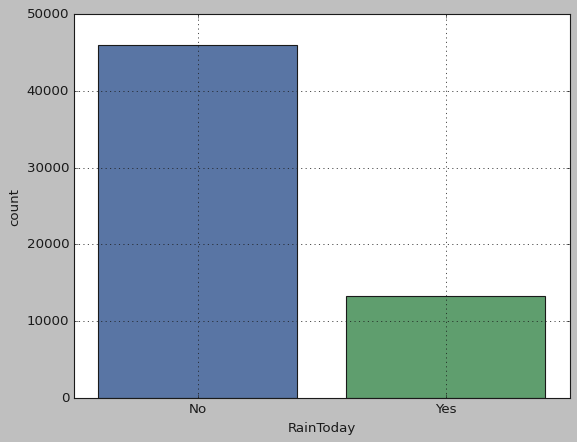

In [ ]:
plt.style.use("classic")
sns.countplot(data=result, x="RainToday")
plt.grid(linewidth = 0.7)
plt.show()

In [ ]:
result.RainTomorrow.unique()

array(['No', 'Yes', nan], dtype=object)

In [ ]:
result['RainTomorrow'].fillna(result['RainTomorrow'].mode()[0], inplace=True)

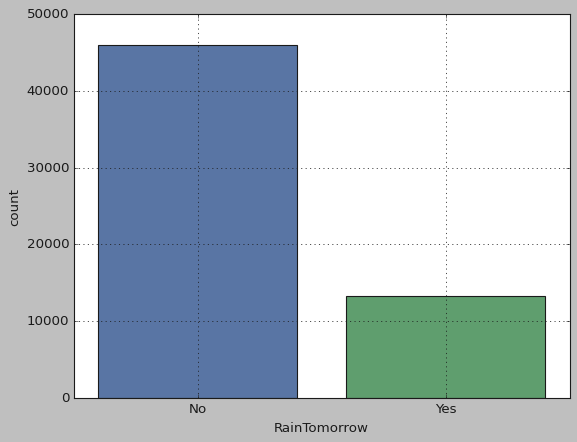

In [ ]:
plt.style.use("classic")
sns.countplot(data=result, x="RainTomorrow")
plt.grid(linewidth = 0.7)
plt.show()

Podemos observar que esta desbalanceada

In [ ]:
result[categorical].isnull().sum()

Date            0
Location        0
WindGustDir     0
WindDir9am      0
WindDir3pm      0
RainToday       0
RainTomorrow    0
dtype: int64

No hay mas valores nulos en las variables categoricas

In [ ]:
result[numerical].isnull().sum()

MinTemp            976
MaxTemp            855
Rainfall          1285
Evaporation      25132
Sunshine         27026
WindGustSpeed     8018
WindSpeed9am       690
WindSpeed3pm      2035
Humidity9am       1068
Humidity3pm       2354
Pressure9am       8108
Pressure3pm       8078
Cloud9am         18276
Cloud3pm         20109
Temp9am            889
Temp3pm           2240
Lat                  0
Lon                  0
dtype: int64

VARIABLES NUMERICAS

In [ ]:
num2 = numerical.copy()

In [ ]:
num3 = result.copy()

In [ ]:
num2_tomice = [i for i in result.columns if num3[i].dtype=='float64']

Vamos a utilizar el metodo de imputacion MICE

In [ ]:

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn import linear_model

num2 = df.filter(['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm','Lat','Lon',], axis=1).copy()

# Definimos el imputador MICE, llenamos los valores vacios y creamos un nuevo dataframe
mice_imputer = IterativeImputer(estimator=linear_model.BayesianRidge(), n_nearest_features=None, imputation_order='ascending')

df_mice_imputed = pd.DataFrame(mice_imputer.fit_transform(num2), columns=num2.columns)

In [ ]:
num3.drop(['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm','Lat','Lon'], axis=1)

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year
0,2008-12-01,Albury,W,W,WNW,No,No,1,12,2008
1,2008-12-02,Albury,WNW,NNW,WSW,No,No,2,12,2008
2,2008-12-03,Albury,WSW,W,WSW,No,No,3,12,2008
3,2008-12-04,Albury,NE,SE,E,No,No,4,12,2008
4,2008-12-05,Albury,W,ENE,NW,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...
59309,2017-06-21,Darwin,E,SE,SE,No,No,21,6,2017
59310,2017-06-22,Darwin,E,E,W,No,No,22,6,2017
59311,2017-06-23,Darwin,ESE,SE,NNW,No,No,23,6,2017
59312,2017-06-24,Darwin,ENE,ENE,NNW,No,No,24,6,2017


In [ ]:
mix = pd.merge(df_mice_imputed, num3)

In [ ]:
mix.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Lat,Lon,Day,Month,Year
0,12.9,20.3,0.2,3.0,10.9,37.0,11.0,26.0,70.0,57.0,...,ENE,W,E,No,No,-33.865143,151.2099,20,10,2010
1,13.3,21.5,0.0,6.6,11.0,41.0,11.0,28.0,75.0,58.0,...,ENE,W,ENE,No,No,-33.865143,151.2099,21,10,2010
2,15.3,23.0,0.0,5.6,11.0,41.0,6.0,19.0,70.0,63.0,...,NNE,W,ENE,No,No,-33.865143,151.2099,22,10,2010
3,12.9,26.7,0.2,3.8,12.1,33.0,13.0,24.0,73.0,56.0,...,NE,W,ENE,No,No,-33.865143,151.2099,26,10,2010
4,14.8,23.8,0.0,6.8,9.6,54.0,13.0,26.0,76.0,69.0,...,SSE,SSE,SE,No,Yes,-33.865143,151.2099,27,10,2010


In [ ]:
mix.isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
Date             0
Location         0
WindGustDir      0
WindDir9am       0
WindDir3pm       0
RainToday        0
RainTomorrow     0
Lat              0
Lon              0
Day              0
Month            0
Year             0
dtype: int64

Mapa de correlacion

<Axes: >

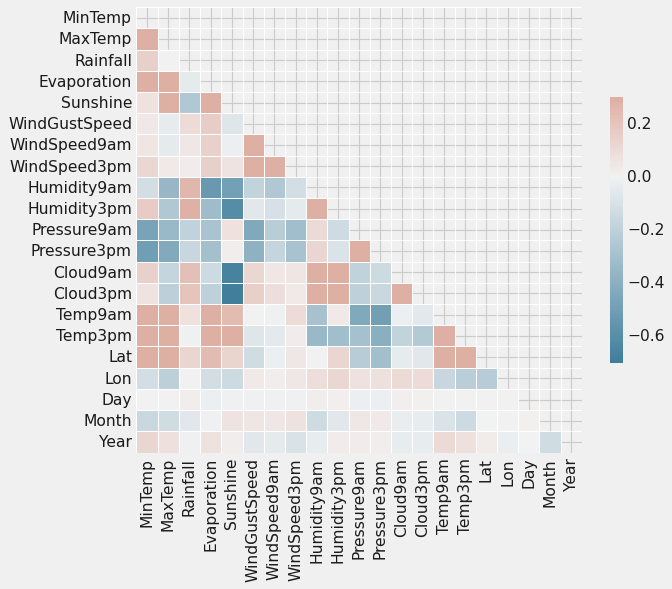

In [ ]:
plt.style.use('fivethirtyeight')

corr = mix.corr()


mask = np.triu(np.ones_like(corr, dtype=bool))


f, ax = plt.subplots(figsize=(8, 8))

cmap = sns.diverging_palette(230, 20, as_cmap=True)


sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})

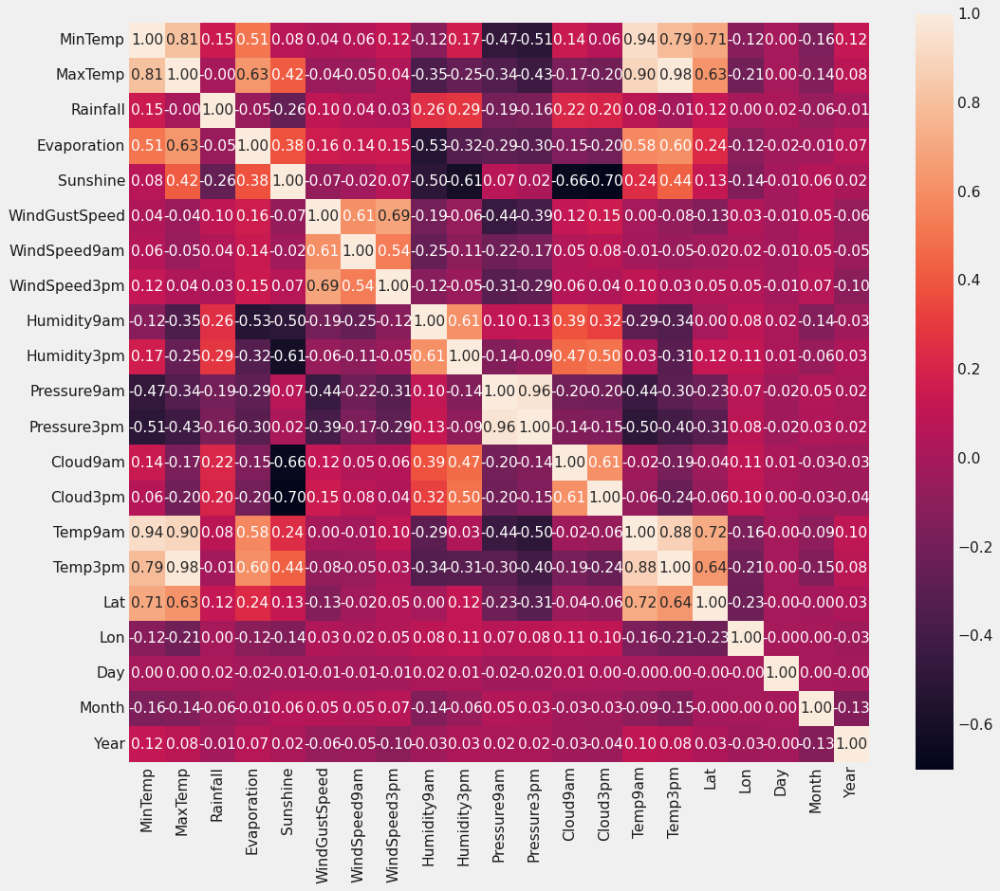

In [ ]:
plt.figure(figsize=(14,12))
ax = sns.heatmap(corr, square=True, annot=True, fmt='.2f')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)          
plt.show()

De la correlacion podemos decir que
📌 MinTemp y MaxTemp estan muy correlacionadas( coefficiente = 0.81).
📌 MinTemp y Temp9am estan muy correlacionadas( coefficiente = 0.94).
📌 MinTemp y Temp3pm festan muy correlacionadas ( coefficiente = 0.79).
📌 MaxTemp y Temp9am estan muy correlacionadas( coefficient = 0.90).
📌 MaxTemp y Temp3pm estan muy correlacionadas ( coefficient = 0.98).
📌 Pressure9am y Pressure3pm estan muy correlacionadas ( coefficiente = 1).
📌 Temp9am y Temp3pm estan muy correlacionadas (coefficiente = 0.88).

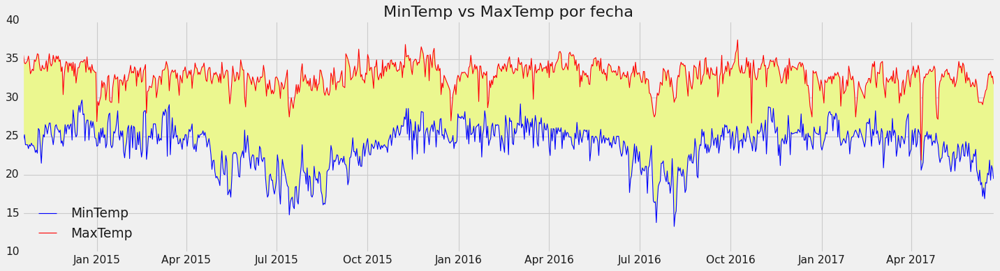

In [ ]:
df_dateplot = mix.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['MinTemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(df_dateplot['Date'],df_dateplot['MaxTemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(df_dateplot['Date'],df_dateplot['MinTemp'],df_dateplot['MaxTemp'], facecolor = '#EBF78F')
plt.title('MinTemp vs MaxTemp por fecha')
plt.legend(loc='lower left', frameon=False)
plt.show()

Al estar en el hemisferio sur, de diciembre a marzo es verano y de junio a agosto el invierno.

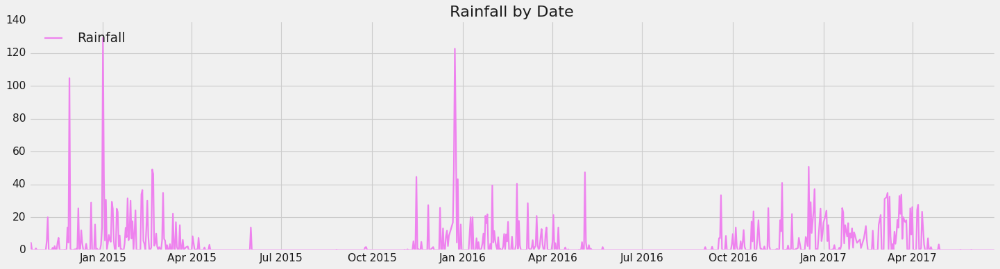

In [ ]:
df_dateplot = mix.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['Rainfall'],color='violet', linewidth=2, label= 'Rainfall')
plt.legend(loc='upper left', frameon=False)
plt.title('Rainfall by Date')
plt.show()

Podemos observar que la mayor cantidad de lluvia se da en los meses correspondientes al verano

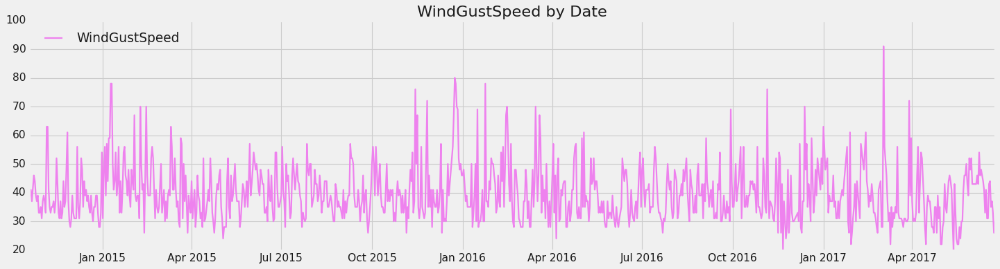

In [ ]:
df_dateplot = mix.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['WindGustSpeed'],color='violet', linewidth=2, label= 'WindGustSpeed')
plt.legend(loc='upper left', frameon=False)
plt.title('WindGustSpeed by Date')
plt.show()

Podemos observar que los meses mas ventosos son en verano, aunque existen picos en otras estaciones tambien

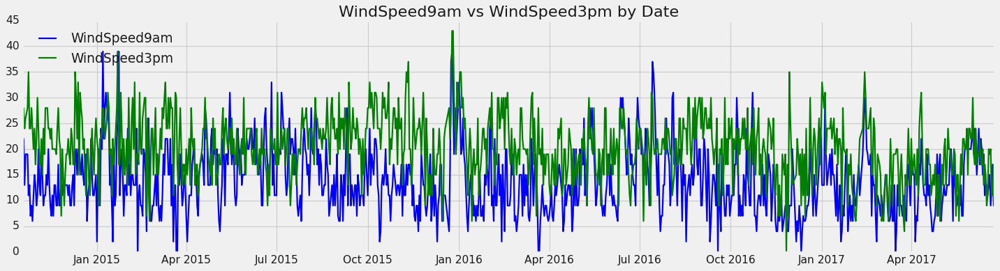

In [ ]:
df_dateplot = mix.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['WindSpeed9am'],color='blue', linewidth=2, label= 'WindSpeed9am')
plt.plot(df_dateplot['Date'],df_dateplot['WindSpeed3pm'],color='green', linewidth=2, label= 'WindSpeed3pm')
plt.legend(loc='upper left', frameon=False)
plt.title('WindSpeed9am vs WindSpeed3pm by Date')
plt.show()

Ambas variables son parecidas gran parte del tiempo


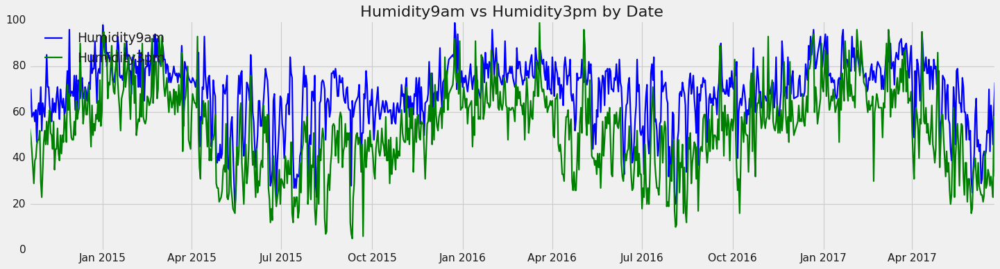

In [ ]:
df_dateplot = mix.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['Humidity9am'],color='blue', linewidth=2, label= 'Humidity9am')
plt.plot(df_dateplot['Date'],df_dateplot['Humidity3pm'],color='green', linewidth=2, label= 'Humidity3pm')
plt.legend(loc='upper left', frameon=False)
plt.title('Humidity9am vs Humidity3pm by Date')
plt.show()

Podemos ver que los periodos de mayor humedad son los de verano

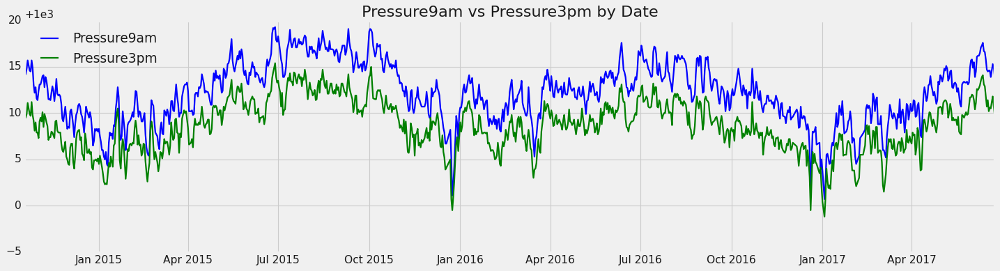

In [ ]:
df_dateplot = mix.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['Pressure9am'],color='blue', linewidth=2, label= 'Pressure9am')
plt.plot(df_dateplot['Date'],df_dateplot['Pressure3pm'],color='green', linewidth=2, label= 'Pressure3pm')
plt.legend(loc='upper left', frameon=False)
plt.title('Pressure9am vs Pressure3pm by Date')
plt.show()

La presion es mas alta entre junio y agosto y empieza a decrecer en octubre, siendo los periodos mas bajos de presion entre diciembre y enero. En un área de baja presión, el aire ascendente se enfría y es probable que condense vapor de agua y forme nubes y, en consecuencia, lluvia.

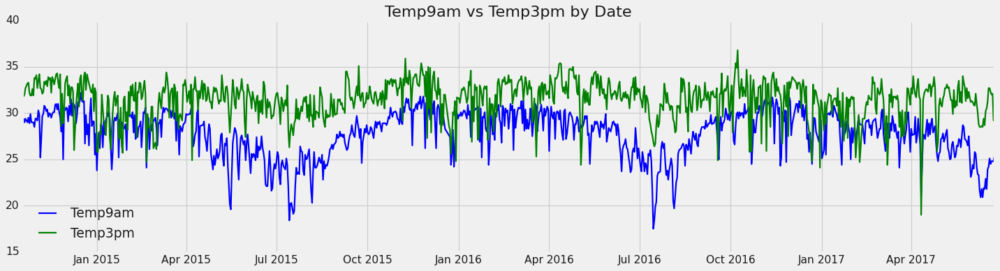

In [ ]:
df_dateplot = mix.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['Temp9am'],color='blue', linewidth=2, label= 'Temp9am')
plt.plot(df_dateplot['Date'],df_dateplot['Temp3pm'],color='green', linewidth=2, label= 'Temp3pm')
plt.legend(loc='lower left', frameon=False)
plt.title('Temp9am vs Temp3pm by Date')
plt.show()

La diferencia entre ambas temperatura es mayor en meses de verano

In [ ]:
mix.drop(['Date'], axis=1, inplace=True)
categorical.remove('Date')

Ya que no vamos a utilizar mas la variable Date, la eliminamos del dataframe

OUTLIERS


Los outliers son observaciónes que se encuentran a una distancia anormal de otros valores en una muestra aleatoria de una población.Usamos Box Plot para detectar los valores atípicos de cada característica en nuestro conjunto de datos, donde cualquier punto por encima o por debajo de los bigotes representa un valor atípico. Esto también se conoce como "método univariado", ya que aquí estamos utilizando un análisis de valores atípicos de una variable.

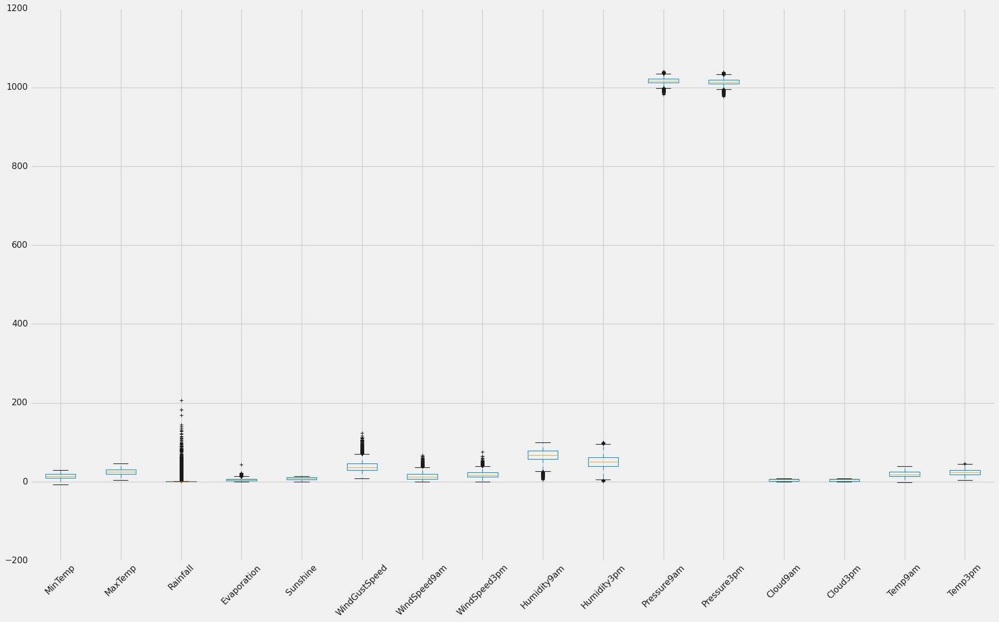

In [ ]:
plt.figure(figsize=[25,15])
mix.boxplot(column= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'])
plt.xticks(rotation=45)
plt.show()

Después de la detección, usamos la imputación de la mediana para solucionar los valores atípicos. En esta técnica, reemplazamos los valores extremos con valores medianos. Se representa por la fórmula IQR = Q3 − Q1. Las líneas de código a continuación calculan e imprimen el rango intercuartílico para cada una de las variables en el conjunto de datos.
Se recomienda no utilizar valores medios, ya que se ven afectados por los valores atípicos.

In [ ]:
for i in mix:
    if mix[i].dtype=='float64':
        q1 = mix[i].quantile(0.25)
        q3 = mix[i].quantile(0.75)
        iqr = q3-q1
        Lower_tail = q1 - 1.5 * iqr
        Upper_tail = q3 + 1.5 * iqr
        med = np.median(mix[i])
        for j in mix[i]:
            if j > Upper_tail or j < Lower_tail:
                mix[i] = mix[i].replace(j, med)
    else:
        continue

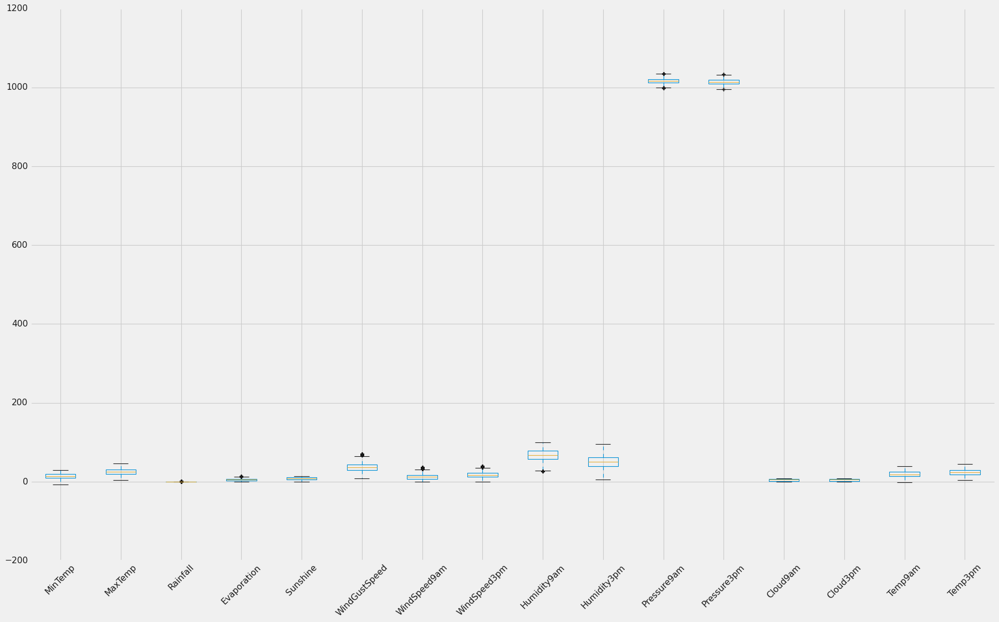

In [ ]:
plt.figure(figsize=[25,15])
mix.boxplot(column= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'])
plt.xticks(rotation=45)
plt.show()

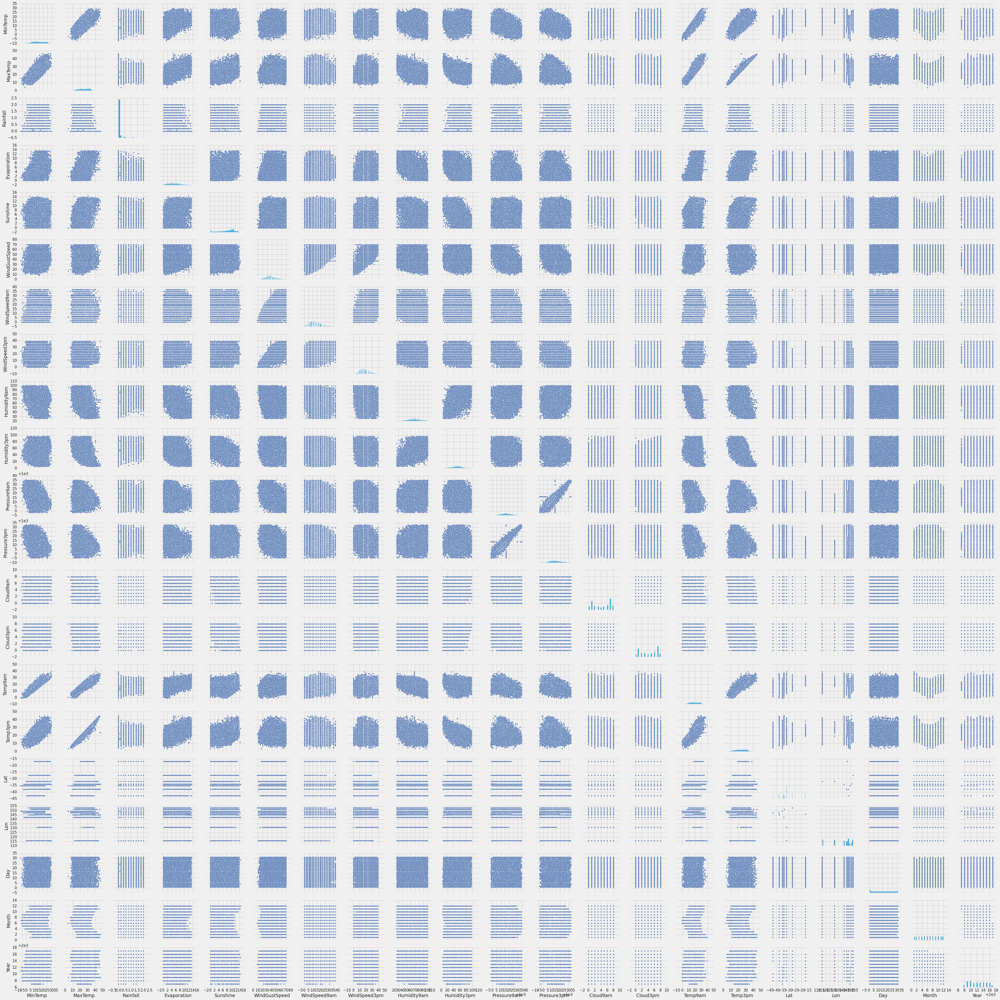

In [ ]:
sns.pairplot(data=mix)
plt.show()

Transformamos los datos categoricos con LabelEncoding
convertirá las etiquetas de destino con un valor entre 0 y n_classes-1.

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
le =  LabelEncoder()
for i in mix:
    if mix[i].dtype=='object':
        mix[i] = le.fit_transform(mix[i])
    else:
        continue

In [ ]:
mix.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23109 entries, 0 to 23108
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MinTemp        23109 non-null  float64
 1   MaxTemp        23109 non-null  float64
 2   Rainfall       23109 non-null  float64
 3   Evaporation    23109 non-null  float64
 4   Sunshine       23109 non-null  float64
 5   WindGustSpeed  23109 non-null  float64
 6   WindSpeed9am   23109 non-null  float64
 7   WindSpeed3pm   23109 non-null  float64
 8   Humidity9am    23109 non-null  float64
 9   Humidity3pm    23109 non-null  float64
 10  Pressure9am    23109 non-null  float64
 11  Pressure3pm    23109 non-null  float64
 12  Cloud9am       23109 non-null  float64
 13  Cloud3pm       23109 non-null  float64
 14  Temp9am        23109 non-null  float64
 15  Temp3pm        23109 non-null  float64
 16  Location       23109 non-null  int64  
 17  WindGustDir    23109 non-null  int64  
 18  WindDi

object data type se convirtio en int64 data type.

In [ ]:
mix.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Lat,Lon,Day,Month,Year
0,12.9,20.3,0.2,3.0,10.9,37.0,11.0,26.0,70.0,57.0,...,1,13,0,0,0,-33.865143,151.2099,20,10,2010
1,13.3,21.5,0.0,6.6,11.0,41.0,11.0,28.0,75.0,58.0,...,1,13,1,0,0,-33.865143,151.2099,21,10,2010
2,15.3,23.0,0.0,5.6,11.0,41.0,6.0,19.0,70.0,63.0,...,5,13,1,0,0,-33.865143,151.2099,22,10,2010
3,12.9,26.7,0.2,3.8,12.1,33.0,13.0,24.0,73.0,56.0,...,4,13,1,0,0,-33.865143,151.2099,26,10,2010
4,14.8,23.8,0.0,6.8,9.6,54.0,13.0,26.0,76.0,69.0,...,10,10,9,0,1,-33.865143,151.2099,27,10,2010


DIVIDIMOS LA DATA EN TEST Y TRAIN

In [ ]:
x = mix.drop('RainTomorrow', axis=1).values
y = mix['RainTomorrow']

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=0)

# BorderlineSMOTE y RandomUnderSampler 

BorderlineSMOTE es una extensión popular de SMOTE que implica seleccionar aquellas instancias de la clase minoritaria que están mal clasificadas, como con un modelo de clasificación de k-vecino más cercano.
En lugar de generar nuevos ejemplos sintéticos para la clase minoritaria a ciegas, esperaríamos que el método Borderline-SMOTE solo cree ejemplos sintéticos a lo largo del límite de decisión entre las dos clases.
El submuestreo aleatorio implica seleccionar aleatoriamente ejemplos de la clase mayoritaria para eliminarlos del conjunto de datos de entrenamiento.
Esto tiene el efecto de reducir la cantidad de ejemplos en la clase mayoritaria en la versión transformada del conjunto de datos de entrenamiento. Este proceso se puede repetir hasta que se logre la distribución de clases deseada, como un número igual de ejemplos para cada clase.

In [ ]:
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline

from collections import Counter

In [ ]:
over = BorderlineSMOTE(sampling_strategy=0.3)
under = RandomUnderSampler(sampling_strategy=0.6)

steps = [('o', over), ('u', under)]

In [ ]:
pipeline = Pipeline(steps=steps)

# transformamos el  dataset
x_sm, y_sm = pipeline.fit_resample(x_train, y_train)

print(Counter(y_train))
print(Counter(y_sm))

Counter({0: 14354, 1: 4133})
Counter({0: 7176, 1: 4306})


In [ ]:
# Nombres de las variables independientes
feature_names = list(mix.drop('RainTomorrow', axis=1).columns)

# Concatenamos la resampling train sets y test sets para hacer un nuevo dataframe 
new_x = np.concatenate((x_sm, x_test))
new_y = np.concatenate((y_sm, y_test))

#nuevo dataframe con las muestras
sm_dataset = pd.DataFrame(np.column_stack([new_y, new_x]), columns=['RainTomorrow'] + feature_names)
sm_dataset.head()

,RainTomorrow,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,...,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,Lat,Lon,Day,Month,Year
0,0.0,13.9,23.4,0.8,6.2,6.8,24.0,6.0,11.0,76.0,...,0.0,0.0,14.0,4.0,0.0,-27.470125,153.021072,24.0,9.0,2014.0
1,0.0,14.0,27.0,0.0,7.0,11.0,48.0,17.0,31.0,59.0,...,1.0,10.0,8.0,9.0,0.0,-16.925491,145.754120,7.0,8.0,2012.0
2,0.0,7.1,23.4,0.0,3.4,10.2,39.0,2.0,7.0,72.0,...,2.0,2.0,9.0,15.0,0.0,-35.282001,149.128998,11.0,4.0,2008.0
3,0.0,14.9,37.8,0.0,5.0,11.6,44.0,20.0,19.0,68.0,...,6.0,3.0,5.0,6.0,0.0,-34.206841,142.136490,20.0,10.0,2013.0
4,0.0,9.5,15.1,0.0,0.8,0.0,17.0,9.0,11.0,85.0,...,5.0,9.0,15.0,11.0,0.0,-37.840935,144.946457,30.0,5.0,2012.0



Del conjunto de datos anterior, podemos ver que nuestras funciones codificadas se han convertido en tipo float. Vamos a convertirlos en tipo int.

In [ ]:
cols = ['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow','Day','Month','Year']
for i in cols:
    sm_dataset[i] = sm_dataset[i].astype(int)
sm_dataset.head()

,RainTomorrow,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,...,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,Lat,Lon,Day,Month,Year
0,0,13.9,23.4,0.8,6.2,6.8,24.0,6.0,11.0,76.0,...,0,0,14,4,0,-27.470125,153.021072,24,9,2014
1,0,14.0,27.0,0.0,7.0,11.0,48.0,17.0,31.0,59.0,...,1,10,8,9,0,-16.925491,145.754120,7,8,2012
2,0,7.1,23.4,0.0,3.4,10.2,39.0,2.0,7.0,72.0,...,2,2,9,15,0,-35.282001,149.128998,11,4,2008
3,0,14.9,37.8,0.0,5.0,11.6,44.0,20.0,19.0,68.0,...,6,3,5,6,0,-34.206841,142.136490,20,10,2013
4,0,9.5,15.1,0.0,0.8,0.0,17.0,9.0,11.0,85.0,...,5,9,15,11,0,-37.840935,144.946457,30,5,2012


# H2O 


H2O de Python es una herramienta para entregar rápidamente modelos, realizar transferencias de datos y crear aplicaciones en un entorno rápido y escalable.

In [ ]:
!apt-get install openjdk-8-jdk

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fonts-dejavu-core fonts-dejavu-extra libatk-wrapper-java
  libatk-wrapper-java-jni libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libxxf86dga1 openjdk-8-jdk-headless openjdk-8-jre
  openjdk-8-jre-headless x11-utils
Suggested packages:
  gvfs openjdk-8-demo openjdk-8-source visualvm libnss-mdns
  fonts-ipafont-gothic fonts-ipafont-mincho fonts-wqy-microhei
  fonts-wqy-zenhei fonts-indic mesa-utils
The following NEW packages will be installed:
  fonts-dejavu-core fonts-dejavu-extra libatk-wrapper-java
  libatk-wrapper-java-jni libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libxxf86dga1 openjdk-8-jdk openjdk-8-jdk-headless
  openjdk-8-jre openjdk-8-jre-headless x11-utils
0 upgraded, 15 newly installed, 0 to remove and 23 not upgraded.
Need to get 45.9 MB of archives.
After this operation, 167 MB

In [ ]:
!java -version

openjdk version "11.0.18" 2023-01-17
OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1)
OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode)


In [ ]:
!pip install H2O

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for H2O: filename=h2o-3.40.0.2-py2.py3-none-any.whl size=177693439 sha256=bc1ac61ff630599cbc7f93e6ac3d204b32f9d26e5fe7c820c35217d495547dc6
  Stored in directory: /root/.cache/pip/wheels/b2/79/e3/842b81607eb31946ee24898cc9961b101e6486f988a5103967
Successfully built H2O


In [ ]:
# empezamos y nos conectamos a un local H2O cluster
import h2o
h2o.init(nthreads = -1)

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp4p1rk5ga
  JVM stdout: /tmp/tmp4p1rk5ga/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp4p1rk5ga/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,13 days
H2O_cluster_name:,H2O_from_python_unknownUser_uxiy97
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
weather = h2o.H2OFrame(sm_dataset)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
weather

RainTomorrow,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,Lat,Lon,Day,Month,Year
0,13.9,23.4,0.8,6.2,6.8,24,6,11,76,56,1025,1020.4,7,3,19.1,22.4,0,0,14,4,0,-27.4701,153.021,24,9,2014
0,14,27,0,7,11,48,17,31,59,40,1021.6,1019.1,1,4,22.2,25,1,10,8,9,0,-16.9255,145.754,7,8,2012
0,7.1,23.4,0,3.4,10.2,39,2,7,72,29,1021,1016.9,0,1,12.7,22.4,2,2,9,15,0,-35.282,149.129,11,4,2008
0,14.9,37.8,0,5,11.6,44,20,19,68,51,1014.3,1009.8,1,2,24.6,36.8,6,3,5,6,0,-34.2068,142.136,20,10,2013
0,9.5,15.1,0,0.8,0,17,9,11,85,80,1016.3,1013.5,8,7,11.5,14.6,5,9,15,11,0,-37.8409,144.946,30,5,2012
0,26.4,34.2,0,8,9.6,37,7,30,66,55,1014.3,1010.1,3,1,29.2,32.2,3,14,12,14,0,-31.9535,130.842,15,10,2011
0,21.3,29,0,2.8,7.9,30,13,17,75,73,1019.9,1016.4,7,6,24.7,26.2,1,10,10,1,1,-16.9255,145.754,24,8,2015
0,9.4,20.3,0,2.6,9.9,43,24,11,62,36,1027.5,1025.4,0,0,11.3,18.3,9,13,13,1,0,-33.8651,151.21,16,7,2012
0,20.8,24.9,0,9.8,0.5,48,17,15,66,63,1016.2,1014,6,8,24,24.3,9,4,4,4,1,-33.8651,151.21,27,1,2016
0,12.3,25.7,0,6.2,10.7,22,4,9,58,51,1022.8,1017.8,1,1,20.5,24.3,0,1,13,4,0,-27.4701,153.021,23,9,2011


In [ ]:
#Convertimos 'Location','WindGustDir','WindDir9am','WindDir3pm','RainToday' y 'RainTomorrow' en categoricas
weather['Location'] = weather['Location'].asfactor()
weather['WindGustDir'] = weather['WindGustDir'].asfactor()
weather['WindDir9am'] = weather['WindDir9am'].asfactor()
weather['WindDir3pm'] = weather['WindDir3pm'].asfactor()
weather['RainToday'] = weather['RainToday'].asfactor()
weather['RainTomorrow'] = weather['RainTomorrow'].asfactor()

In [ ]:
# Definimos las features manualmente
features = ['Location','MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustDir','WindGustSpeed','WindDir9am','WindDir3pm','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm','RainToday','Day','Month','Year']

In [ ]:
# Separamos el dataframe H2O en training/test 
# para evaluar la performance
weather_split = weather.split_frame(ratios = [0.8], seed = 1234)

weather_train = weather_split[0] # usando 80% para el  training
weather_test = weather_split[1]  # usando el  20% restante para la  evaluacion

In [ ]:
weather_train.shape

(12945, 27)

In [ ]:
weather_test.shape

(3159, 27)

# H2OGeneralizedLinearEstimator

Creamos un modelo lineal generalizado especificado por una variable de respuesta, un conjunto de predictores y una descripción de la distribución de errores.

In [ ]:


# Importamos la funcion para GLM
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# Setamos el GLM para clasificacion binaria
glm_default = H2OGeneralizedLinearEstimator(family = 'binomial', model_id = 'glm_default', keep_cross_validation_predictions = True, nfolds =5, fold_assignment = "stratified", balance_classes=True)

# Usamos .train() para hacer el modelo
glm_default.train(x = features, 
                  y = 'RainTomorrow', 
                  training_frame = weather_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: glm_default


GLM Model: summary
    family    link    regularization                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ---------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Elastic Net (alpha = 0.5, lambda = 4.658E-4 )  79                            64                             4                       py_8_sid_903c

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.12950568347755192
RMSE: 0.35986898098829234
LogLoss: 0.40235571970108663
AUC: 0.8812493525237258
AUCPR: 0.7963139755612068
Gini: 0.7624987050474517
Null degrees of freedom: 12944
Residual degrees of freedom: 12880
Null deviance: 16498.69184054898
Residual deviance: 10416.989583061131
AIC: 10546.989583061131

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.341864471431149
       0     1     Error    Rate
-----  ----  ----  -------  ----------------
0      6929  1687  0.1958   (1687.0/8616.0)
1      905   3424  0.2091   (905.0/4329.0)
Total  7834  5111  0.2002   (2592.0/12945.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.341864     0.725424  225
max f2                       0.166295     0.814195  303
max f0point5                 0.584253     0.740545  142
max accuracy                 0.478476     0.811587  174
max precision                0.993644     1         0
max recall                   0.0161773    1         393
max specificity              0.993644     1         0
max absolute_mcc             0.366613     0.576744  215
max min_per_class_accuracy   0.330616     0.796541  229
max mean_per_class_accuracy  0.341864     0.797573  225
max tns                      0.993644     8616      0
max fns                      0.993644     4322      0
max fps                      0.00422026   8616      399
max tps                      0.0161773    4329      393
max tnr                      0.993644     1         0
max fnr                      0.993644     0.998383  0
max fpr                      0.00422026   1         399
max tpr                      0.0161773    1         393

Gains/Lift Table: Avg response rate: 33.44 %, avg score: 33.44 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100425                   0.973463           2.92129    2.92129            0.976923         0.982968   0.976923                    0.982968            0.029337        0.029337                   192.129   192.129            0.0289888
2        0.0200077                   0.959109           2.87439    2.89793            0.96124          0.966354   0.969112                    0.974693            0.028644        0.0579811                  187.439   189.793            0.0570526
3        0.0300502                   0.946295           2.89829    2.89805            0.969231         0.952751   0.969152                    0.96736             0.029106        0.0870871                  189.829   189.805            0.0856943
4        0.0400154                   0.932503           2.80485    2.87484            0.937984         0.939441   0.96139                     0.960407            0.027951        0.115038                   180.485   187.4

In [ ]:
# Checkeamos la performance del mmodelo en el training dataset
glm_default

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: glm_default


GLM Model: summary
    family    link    regularization                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ---------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Elastic Net (alpha = 0.5, lambda = 4.658E-4 )  79                            64                             4                       py_8_sid_903c

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.12950568347755192
RMSE: 0.35986898098829234
LogLoss: 0.40235571970108663
AUC: 0.8812493525237258
AUCPR: 0.7963139755612068
Gini: 0.7624987050474517
Null degrees of freedom: 12944
Residual degrees of freedom: 12880
Null deviance: 16498.69184054898
Residual deviance: 10416.989583061131
AIC: 10546.989583061131

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.341864471431149
       0     1     Error    Rate
-----  ----  ----  -------  ----------------
0      6929  1687  0.1958   (1687.0/8616.0)
1      905   3424  0.2091   (905.0/4329.0)
Total  7834  5111  0.2002   (2592.0/12945.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.341864     0.725424  225
max f2                       0.166295     0.814195  303
max f0point5                 0.584253     0.740545  142
max accuracy                 0.478476     0.811587  174
max precision                0.993644     1         0
max recall                   0.0161773    1         393
max specificity              0.993644     1         0
max absolute_mcc             0.366613     0.576744  215
max min_per_class_accuracy   0.330616     0.796541  229
max mean_per_class_accuracy  0.341864     0.797573  225
max tns                      0.993644     8616      0
max fns                      0.993644     4322      0
max fps                      0.00422026   8616      399
max tps                      0.0161773    4329      393
max tnr                      0.993644     1         0
max fnr                      0.993644     0.998383  0
max fpr                      0.00422026   1         399
max tpr                      0.0161773    1         393

Gains/Lift Table: Avg response rate: 33.44 %, avg score: 33.44 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100425                   0.973463           2.92129    2.92129            0.976923         0.982968   0.976923                    0.982968            0.029337        0.029337                   192.129   192.129            0.0289888
2        0.0200077                   0.959109           2.87439    2.89793            0.96124          0.966354   0.969112                    0.974693            0.028644        0.0579811                  187.439   189.793            0.0570526
3        0.0300502                   0.946295           2.89829    2.89805            0.969231         0.952751   0.969152                    0.96736             0.029106        0.0870871                  189.829   189.805            0.0856943
4        0.0400154                   0.932503           2.80485    2.87484            0.937984         0.939441   0.96139                     0.960407            0.027951        0.115038                   180.485   187.4

<Figure size 400x400 with 0 Axes>

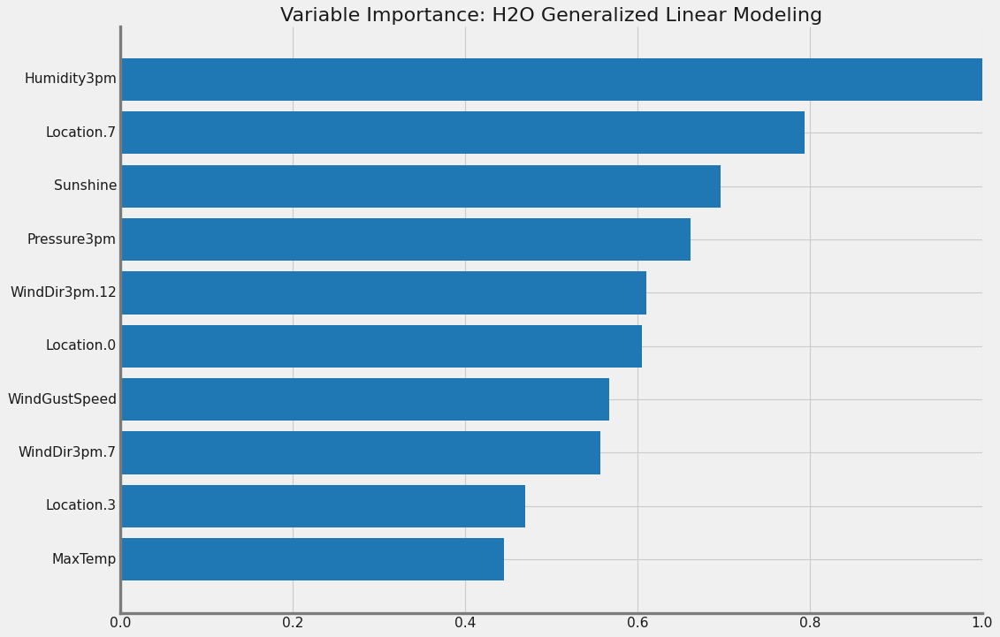

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure(figsize=(5,5))
variable = glm_default.varimp_plot()
plt.show()

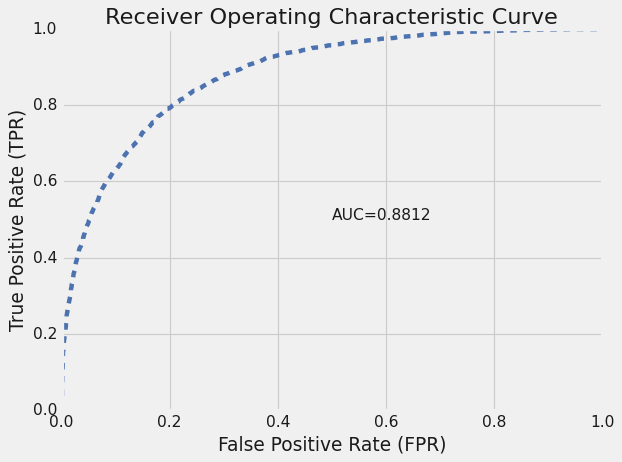

([0.0,
  0.0,
  0.0,
  0.0,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0009285051067780873,
  0.0009285051067780873,
  0.0009285051067780873,
  0.0009285051067780873,
  0.0009285051067780873,
  0.0009285051067780873,
  0.0009285051067780873,
  0.00127669452181987,
  0.001392757660167131,
  0.001392757660167131,
  0.0016248839368616526,
  0.0016248839368616526,
  0.0017409470752089136,
  0.0020891364902506965,
  0.0020891364902506965,
  0.002321262766945218,
  0.002321262766945218,
  0.002669452181987001,
  0.002669452181987001,
  0.002669452181987001,
  0.002669452181987001,
  0.0029015784586815226,
  0.00383008356545961,
  0.003946146703806871,
  0.004062209842154132,
  0.0044103992571959145,
  0.004642525533890436,
  0.005338904363974002,
  0.005338904363974002,
  0.0060352831940575676,
  0.006267409470752089,
  0.007428040854224698,
  0.007428040854224698,
  0.007892293

In [ ]:
performace = glm_default.model_performance(train=True)
performace.plot()


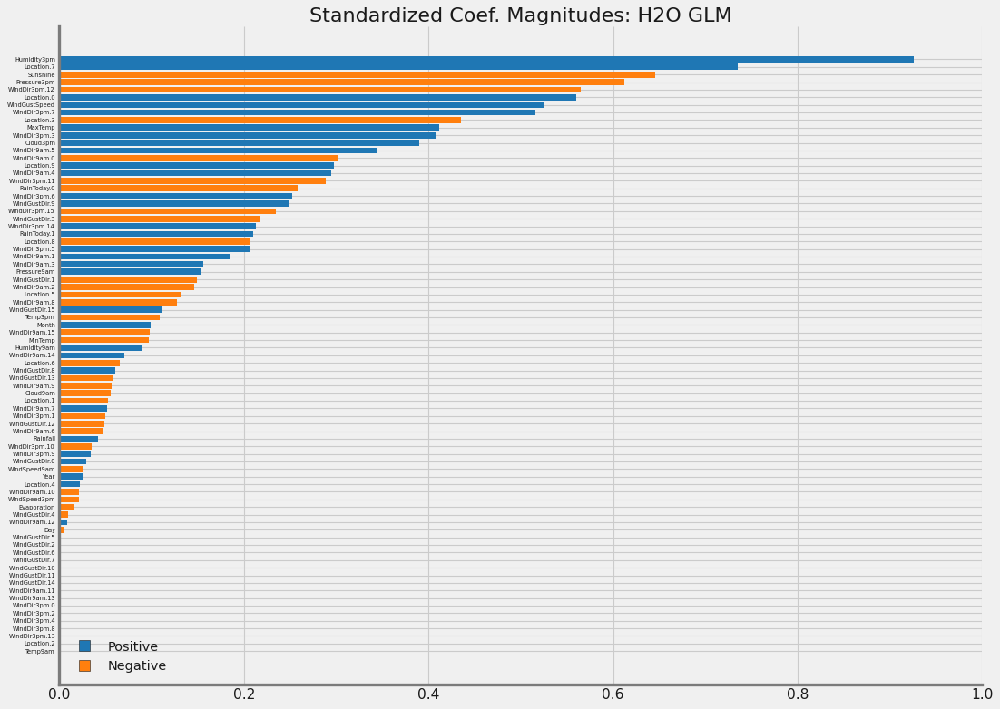

In [ ]:
coef = glm_default.std_coef_plot()
plt.yticks(size=6)
plt.tight_layout()
plt.show()

In [ ]:
# Checkeamos la performance del modelo en el test dataset
glm_default.model_performance(weather_test)

ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1280234552776419
RMSE: 0.357803654645452
LogLoss: 0.3963085958033363
AUC: 0.8831313314368768
AUCPR: 0.7916688277245423
Gini: 0.7662626628737537
Null degrees of freedom: 3158
Residual degrees of freedom: 3094
Null deviance: 3980.216062093999
Residual deviance: 2503.8777082854785
AIC: 2633.8777082854785

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32120375766825177
       0     1     Error    Rate
-----  ----  ----  -------  --------------
0      1697  439   0.2055   (439.0/2136.0)
1      192   831   0.1877   (192.0/1023.0)
Total  1889  1270  0.1997   (631.0/3159.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.321204     0.724815  235
max f2                       0.188518     0.814296  290
max f0point5                 0.577754     0.726216  146
max accuracy                 0.457702     0.813232  186
max precision                0.993983     1         0
max recall                   0.0173706    1         390
max specificity              0.993983     1         0
max absolute_mcc             0.330486     0.579208  232
max min_per_class_accuracy   0.335706     0.801498  230
max mean_per_class_accuracy  0.28652      0.805226  249
max tns                      0.993983     2136      0
max fns                      0.993983     1022      0
max fps                      0.00347687   2136      399
max tps                      0.0173706    1023      390
max tnr                      0.993983     1         0
max fnr                      0.993983     0.999022  0
max fpr                      0.00347687   1         399
max tpr                      0.0173706    1         390

Gains/Lift Table: Avg response rate: 32.38 %, avg score: 33.10 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0101298                   0.969799           3.08798    3.08798            1                0.978813   1                           0.978813            0.0312805       0.0312805                  208.798   208.798            0.0312805
2        0.0202596                   0.956382           3.08798    3.08798            1                0.962838   1                           0.970826            0.0312805       0.0625611                  208.798   208.798            0.0625611
3        0.0300728                   0.947327           2.88875    3.02297            0.935484         0.952405   0.978947                    0.964815            0.028348        0.0909091                  188.875   202.297            0.0899728
4        0.0402026                   0.932953           2.99148    3.01503            0.96875          0.93972    0.976378                    0.958492            0.030303        0.121212                   199.148   201.503            0.119808
5        0.0500158                   0.916543           2.98836    3.0098             0.967742         0.924579   0.974684                    0.951838            0.0293255       0.150538                   198.836   200.98             0.148665
6        0.100032                    0.830328           2.65801    2.8339             0.860759         0.876207   0.917722                    0.914023            0.132942        0.28348                    165.801   183.39             0.271308
7        0.150047                    0.742112           2.18895    2.61892            0.708861         0.791609   0.848101                    

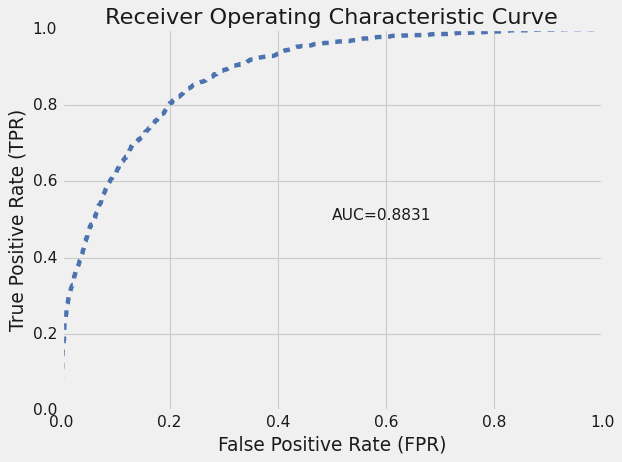

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.00046816479400749064,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0023408239700374533,
  0.0023408239700374533,
  0.0028089887640449437,
  0.0032771535580524347,
  0.0032771535580524347,
  0.003745318352059925,
  0.003745318352059925,
  0.0046816479400749065,
  0.0046816479400749065,
  0.0046816479400749065,
  0.0046816479400749065,
  0.005149812734082397,
  0.005149812734082397,
  0.005149812734082397,
  0.0056179775280898875,
  0.0056179775280898875,
  0.006086142322097378,
  0.00749063670411985,
  0.00749063670411985,
  0.007958801498127341,
  0.007958801498127341,
  0.008895131086142321,
  0.008

In [ ]:
performace = glm_default.model_performance(weather_test)
performace.plot()

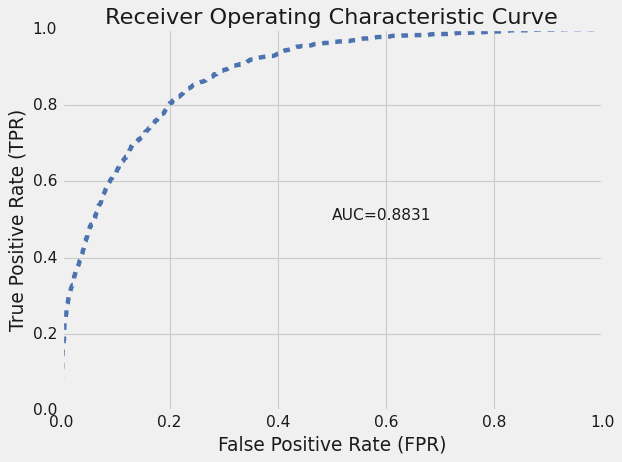

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.00046816479400749064,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0023408239700374533,
  0.0023408239700374533,
  0.0028089887640449437,
  0.0032771535580524347,
  0.0032771535580524347,
  0.003745318352059925,
  0.003745318352059925,
  0.0046816479400749065,
  0.0046816479400749065,
  0.0046816479400749065,
  0.0046816479400749065,
  0.005149812734082397,
  0.005149812734082397,
  0.005149812734082397,
  0.0056179775280898875,
  0.0056179775280898875,
  0.006086142322097378,
  0.00749063670411985,
  0.00749063670411985,
  0.007958801498127341,
  0.007958801498127341,
  0.008895131086142321,
  0.008

In [ ]:
performace = glm_default.model_performance(weather_test)
performace.plot()

In [ ]:
# Usamos el modelo GLM para hacer predicciones
yhat_test_glm = glm_default.predict(weather_test)
yhat_test_glm.head(5)

glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict,p0,p1
0,0.721831,0.278169
0,0.948951,0.0510485
0,0.990811,0.00918877
0,0.857134,0.142866
0,0.908811,0.091189


# H2ORandomForestEstimator 

HACEMOS UN RANDOMFOREST CON EL DATAFRAME H2O

In [ ]:
# Hacemos un  Random Forest (DRF) distribuido

# importamos las funciones DRF
from h2o.estimators.random_forest import H2ORandomForestEstimator

# Seteamos el  DRF para clasificacion
# agregamos la semilla para la reproducir
drf_default = H2ORandomForestEstimator(model_id = 'drf_default', seed = 1234, keep_cross_validation_predictions = True, nfolds =5, fold_assignment = "stratified", balance_classes=True)

# Usamos .train() para crear el modelo
drf_default.train(x = features, 
                  y = 'RainTomorrow', 
                  training_frame = weather_train)

drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: drf_default


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          1.03627e+06            20           20           20            1578          1740          1645.72

ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.06739137944515539
RMSE: 0.2595984966157458
LogLoss: 0.27035649080068985
Mean Per-Class Error: 0.061157464556310284
AUC: 0.9792779364781866
AUCPR: 0.9726677579218285
Gini: 0.9585558729563732

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44371134325499983
       0     1     Error    Rate
-----  ----  ----  -------  ----------------
0      7852  764   0.0887   (764.0/8616.0)
1      290   8330  0.0336   (290.0/8620.0)
Total  8142  9094  0.0612   (1054.0/17236.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.443711     0.940499  222
max f2                       0.360976     0.964624  252
max f0point5                 0.544683     0.934815  183
max accuracy                 0.443711     0.938849  222
max precision                0.997818     0.991276  1
max recall                   0.0502114    1         374
max specificity              0.999999     0.998143  0
max absolute_mcc             0.443711     0.879027  222
max min_per_class_accuracy   0.501097     0.929898  200
max mean_per_class_accuracy  0.443711     0.938843  222
max tns                      0.999999     8600      0
max fns                      0.999999     6819      0
max fps                      3.06093e-06  8616      399
max tps                      0.0502114    8620      374
max tnr                      0.999999     0.998143  0
max fnr                      0.999999     0.791067  0
max fpr                      3.06093e-06  1         399
max tpr                      0.0502114    1         374

Gains/Lift Table: Avg response rate: 50.01 %, avg score: 47.39 %
group    cumulative_data_fraction    lower_threshold    lift        cumulative_lift    response_rate    score        cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ----------  -----------------  ---------------  -----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.105361                    1                  1.98192     1.98192            0.991189         1            0.991189                    1                   0.208817        0.208817                   98.1919   98.1919            0.20696
2        0.15514                     0.900395           1.9506      1.97187            0.975524         0.924281     0.986163                    0.975704            0.0970998       0.305916                   95.0596   97.1868            0.301622
3        0.200046                    0.870626           1.9582      1.9688             0.979328         0.886217     0.984629                    0.955617            0.087935        0.393852                   95.8202   96.8801            0.3877
4        0.302738                    0.765496           1.92159     1.95279            0.961017         0.813158     0.976619                    0.907293            0.197332        0.591183                   92.1588   95.2786            0.577024
5        0.402414                    0.653171           1.85405     1.92833            0.927241         0.708519     0.964389                   

In [ ]:

drf_default

Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: drf_default


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          1.03627e+06            20           20           20            1578          1740          1645.72

ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.06739137944515539
RMSE: 0.2595984966157458
LogLoss: 0.27035649080068985
Mean Per-Class Error: 0.061157464556310284
AUC: 0.9792779364781866
AUCPR: 0.9726677579218285
Gini: 0.9585558729563732

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44371134325499983
       0     1     Error    Rate
-----  ----  ----  -------  ----------------
0      7852  764   0.0887   (764.0/8616.0)
1      290   8330  0.0336   (290.0/8620.0)
Total  8142  9094  0.0612   (1054.0/17236.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.443711     0.940499  222
max f2                       0.360976     0.964624  252
max f0point5                 0.544683     0.934815  183
max accuracy                 0.443711     0.938849  222
max precision                0.997818     0.991276  1
max recall                   0.0502114    1         374
max specificity              0.999999     0.998143  0
max absolute_mcc             0.443711     0.879027  222
max min_per_class_accuracy   0.501097     0.929898  200
max mean_per_class_accuracy  0.443711     0.938843  222
max tns                      0.999999     8600      0
max fns                      0.999999     6819      0
max fps                      3.06093e-06  8616      399
max tps                      0.0502114    8620      374
max tnr                      0.999999     0.998143  0
max fnr                      0.999999     0.791067  0
max fpr                      3.06093e-06  1         399
max tpr                      0.0502114    1         374

Gains/Lift Table: Avg response rate: 50.01 %, avg score: 47.39 %
group    cumulative_data_fraction    lower_threshold    lift        cumulative_lift    response_rate    score        cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ----------  -----------------  ---------------  -----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.105361                    1                  1.98192     1.98192            0.991189         1            0.991189                    1                   0.208817        0.208817                   98.1919   98.1919            0.20696
2        0.15514                     0.900395           1.9506      1.97187            0.975524         0.924281     0.986163                    0.975704            0.0970998       0.305916                   95.0596   97.1868            0.301622
3        0.200046                    0.870626           1.9582      1.9688             0.979328         0.886217     0.984629                    0.955617            0.087935        0.393852                   95.8202   96.8801            0.3877
4        0.302738                    0.765496           1.92159     1.95279            0.961017         0.813158     0.976619                    0.907293            0.197332        0.591183                   92.1588   95.2786            0.577024
5        0.402414                    0.653171           1.85405     1.92833            0.927241         0.708519     0.964389                   

<Figure size 400x400 with 0 Axes>

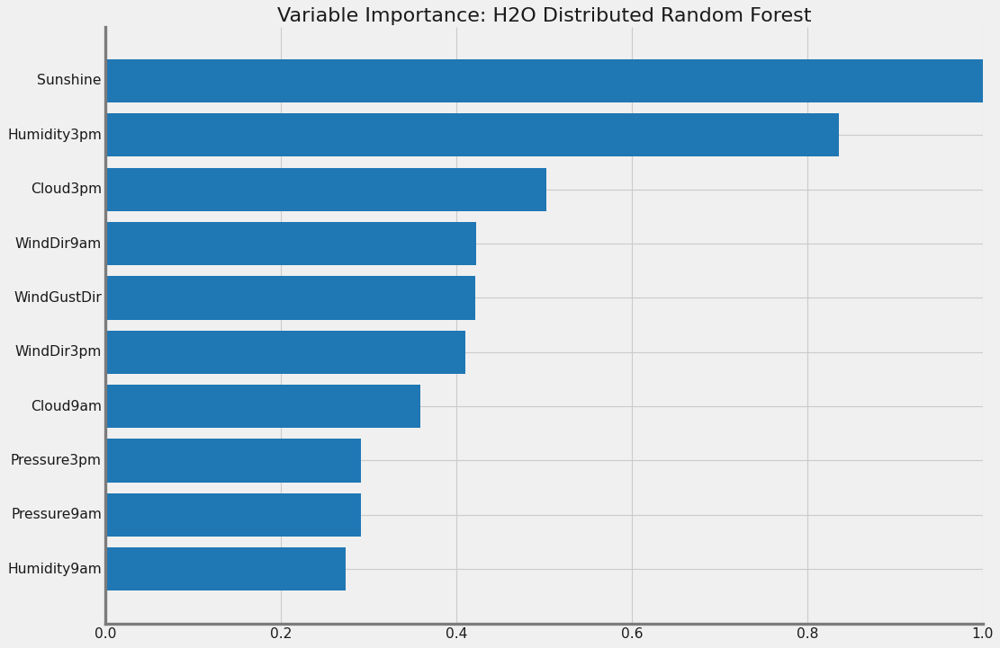

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure(figsize=(5,5))
variable = drf_default.varimp_plot()
plt.show()

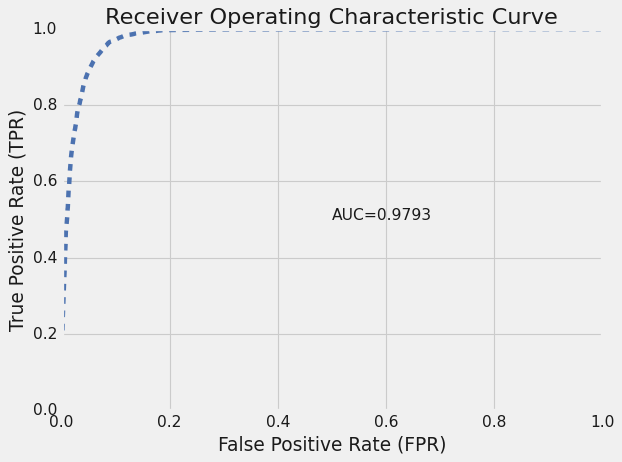

([0.0018570102135561746,
  0.0018570102135561746,
  0.0019730733519034353,
  0.0019730733519034353,
  0.0019730733519034353,
  0.0019730733519034353,
  0.0019730733519034353,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.0020891364902506965,
  0.002321262766945218,
  0.002321262766945218,
  0.002321262766945218,
  0.002437325905292479,
  0.002669452181987001,
  0.002669452181987001,
  0.0029015784586815226,
  0.0029015784586815226,
  0.003714020427112349,
  0.003714020427112349,
  0.004294336118848653,
  0.004294336118848653,
  0.004642525533890436,
  0.004642525533890436,
  0.005222841225626741,
  0.005222841

In [ ]:
performace = drf_default.model_performance(train=True)
performace.plot()

In [ ]:
#chekeamos la performance en el test
drf_default.model_performance(weather_test)

ModelMetricsBinomial: drf
** Reported on test data. **

MSE: 0.12848987351422916
RMSE: 0.35845484166660263
LogLoss: 0.42637652138180737
Mean Per-Class Error: 0.1962200841323712
AUC: 0.8865791843772997
AUCPR: 0.8031654744676849
Gini: 0.7731583687545993

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24770155429062723
       0     1     Error    Rate
-----  ----  ----  -------  --------------
0      1636  500   0.2341   (500.0/2136.0)
1      162   861   0.1584   (162.0/1023.0)
Total  1798  1361  0.2096   (662.0/3159.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.247702     0.722315  260
max f2                       0.158888     0.814955  310
max f0point5                 0.474393     0.749169  138
max accuracy                 0.393391     0.821779  178
max precision                1            1         0
max recall                   3.37715e-06  1         399
max specificity              1            1         0
max absolute_mcc             0.389911     0.582758  179
max min_per_class_accuracy   0.282943     0.796816  241
max mean_per_class_accuracy  0.235359     0.805128  267
max tns                      1            2136      0
max fns                      1            1001      0
max fps                      3.37715e-06  2136      399
max tps                      3.37715e-06  1023      399
max tnr                      1            1         0
max fnr                      1            0.978495  0
max fpr                      3.37715e-06  1         399
max tpr                      3.37715e-06  1         399

Gains/Lift Table: Avg response rate: 32.38 %, avg score: 28.08 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score        cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  -----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0183602                   0.96095            3.08798    3.08798            1                0.975762     1                           0.975762            0.056696        0.056696                   208.798   208.798            0.056696
2        0.0291231                   0.923389           2.81551    2.98728            0.911765         0.926926     0.967391                    0.957714            0.030303        0.086999                   181.551   198.728            0.0855945
3        0.0300728                   0.891889           3.08798    2.99046            1                0.913566     0.968421                    0.95632             0.00293255      0.0899316                  208.798   199.046            0.0885271
4        0.0408357                   0.887233           3.08798    3.01616            1                0.887233     0.976744                    0.938111            0.0332356       0.123167                   208.798   201.616            0.121763
5        0.0550807                   0.852406           2.88211    2.98149            0.933333         0.859598     0.965517                    0.917806            0.0410557       0.164223                   188.211   198.149            0.161414
6        0.10383                     0.725016           2.76715    2.88086            0.896104         0.77473      0.932927                    0.85063             0.134897        0.29912                    176.715   188.086            0.288821
7        0.154163                    0.613946           2.23344    2.66948            0.72327          0.665349     0.864476                    0.790138            0.112414        0.411535                   123.344   166.948            0.380636

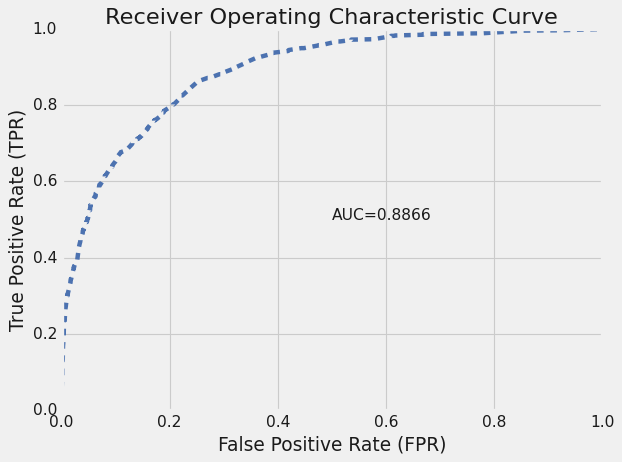

([0.0,
  0.0,
  0.0,
  0.0,
  0.00046816479400749064,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0023408239700374533,
  0.0023408239700374533,
  0.0028089887640449437,
  0.0028089887640449437,
  0.0028089887640449437,
  0.0028089887640449437,
  0.004213483146067416,
  0.004213483146067416,
  0.004213483146067416,
  0.004213483146067416,
  0.004213483146067416,
  0.004213483146067416,
  0.004213483146067416,
  0.004213483146067416,
  0.0046816479400749065,
  0.005149812734082397,
  0.0056179775280898875,
  0.006086142322097378,
  0.006086142322097378,
  0.006086142322097378,
  0.006086142322097378,
  0.006086142322097378,
  0.006086142322097378,
  0.00749063670411985,
  0.00749063670411985,
  0.007958801498127341,
  0.007958801498127341,
  0.007958801498127341,
  0.010299625468164793,
  0.011235955056179

In [ ]:
performace = drf_default.model_performance(weather_test)
performace.plot()

In [ ]:
# Usamos el modelo para hacer predicciones
yhat_test_drf = drf_default.predict(weather_test)
yhat_test_drf.head(5)

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict,p0,p1
0,0.96894,0.0310599
0,0.974249,0.0257511
0,1,0
0,0.940705,0.0592949
0,0.958157,0.0418427


# H2OGradientBoostingEstimator 

La función de distribución predeterminada adivinará el tipo de modelo en función del tipo de columna de respuesta. Si se ejecuta correctamente, la columna de respuesta debe ser un número para "gaussiano" o una enumeración para "bernoulli" o "multinomial".

In [ ]:
# Creamos un modelo Gradient Boosting Machines (GBM) 
# Importamos la funcion para GBM
from h2o.estimators.gbm import H2OGradientBoostingEstimator

# Seteamos el  GBM para la clasificacion
# agregamos la semilla
gbm_default = H2OGradientBoostingEstimator(model_id = 'gbm_default', seed = 1234, keep_cross_validation_predictions = True, nfolds =5, fold_assignment = "stratified", balance_classes=True)

# Usamos .train() para armar el modelo
gbm_default.train(x = features, 
                  y = 'RainTomorrow', 
                  training_frame = weather_train)

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: gbm_default


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          22038                  5            5            5             26            32            30.4

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.12091998755184756
RMSE: 0.3477355137915131
LogLoss: 0.3787723198303399
Mean Per-Class Error: 0.14929403451626178
AUC: 0.9345433858014119
AUCPR: 0.9333499009690084
Gini: 0.8690867716028239

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27508443067483795
       0     1     Error    Rate
-----  ----  ----  -------  ----------------
0      6830  1786  0.2073   (1786.0/8616.0)
1      787   7833  0.0913   (787.0/8620.0)
Total  7617  9619  0.1493   (2573.0/17236.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.275084     0.858929  277
max f2                       0.180287     0.910972  312
max f0point5                 0.54035      0.863846  175
max accuracy                 0.337313     0.85188   253
max precision                0.961793     1         0
max recall                   0.0461648    1         375
max specificity              0.961793     1         0
max absolute_mcc             0.275084     0.706192  277
max min_per_class_accuracy   0.356584     0.848724  246
max mean_per_class_accuracy  0.337313     0.851877  253
max tns                      0.961793     8616      0
max fns                      0.961793     8612      0
max fps                      0.00964131   8616      399
max tps                      0.0461648    8620      375
max tnr                      0.961793     1         0
max fnr                      0.961793     0.999072  0
max fpr                      0.00964131   1         399
max tpr                      0.0461648    1         375

Gains/Lift Table: Avg response rate: 50.01 %, avg score: 40.29 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100371                   0.941975           1.99954    1.99954            1                0.948619   1                           0.948619            0.0200696       0.0200696                  99.9536   99.9536            0.0200696
2        0.0200743                   0.934843           1.98798    1.99376            0.99422          0.938028   0.99711                     0.943324            0.0199536       0.0400232                  98.7978   99.3757            0.0399071
3        0.0301114                   0.92668            1.98798    1.99183            0.99422          0.930325   0.996146                    0.938991            0.0199536       0.0599768                  98.7978   99.1831            0.0597447
4        0.0400905                   0.921115           1.99954    1.99375            1                0.923742   0.997106                    0.935195            0.0199536       0.0799304                  99.9536   99.3749            0.0796983
5        0.0500116                   0.914372           1.99954    1.9949             1                0.917856   0.99768                     0.931755     

In [ ]:

gbm_default

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: gbm_default


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          22038                  5            5            5             26            32            30.4

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.12091998755184756
RMSE: 0.3477355137915131
LogLoss: 0.3787723198303399
Mean Per-Class Error: 0.14929403451626178
AUC: 0.9345433858014119
AUCPR: 0.9333499009690084
Gini: 0.8690867716028239

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27508443067483795
       0     1     Error    Rate
-----  ----  ----  -------  ----------------
0      6830  1786  0.2073   (1786.0/8616.0)
1      787   7833  0.0913   (787.0/8620.0)
Total  7617  9619  0.1493   (2573.0/17236.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.275084     0.858929  277
max f2                       0.180287     0.910972  312
max f0point5                 0.54035      0.863846  175
max accuracy                 0.337313     0.85188   253
max precision                0.961793     1         0
max recall                   0.0461648    1         375
max specificity              0.961793     1         0
max absolute_mcc             0.275084     0.706192  277
max min_per_class_accuracy   0.356584     0.848724  246
max mean_per_class_accuracy  0.337313     0.851877  253
max tns                      0.961793     8616      0
max fns                      0.961793     8612      0
max fps                      0.00964131   8616      399
max tps                      0.0461648    8620      375
max tnr                      0.961793     1         0
max fnr                      0.961793     0.999072  0
max fpr                      0.00964131   1         399
max tpr                      0.0461648    1         375

Gains/Lift Table: Avg response rate: 50.01 %, avg score: 40.29 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100371                   0.941975           1.99954    1.99954            1                0.948619   1                           0.948619            0.0200696       0.0200696                  99.9536   99.9536            0.0200696
2        0.0200743                   0.934843           1.98798    1.99376            0.99422          0.938028   0.99711                     0.943324            0.0199536       0.0400232                  98.7978   99.3757            0.0399071
3        0.0301114                   0.92668            1.98798    1.99183            0.99422          0.930325   0.996146                    0.938991            0.0199536       0.0599768                  98.7978   99.1831            0.0597447
4        0.0400905                   0.921115           1.99954    1.99375            1                0.923742   0.997106                    0.935195            0.0199536       0.0799304                  99.9536   99.3749            0.0796983
5        0.0500116                   0.914372           1.99954    1.9949             1                0.917856   0.99768                     0.931755     

<Figure size 400x400 with 0 Axes>

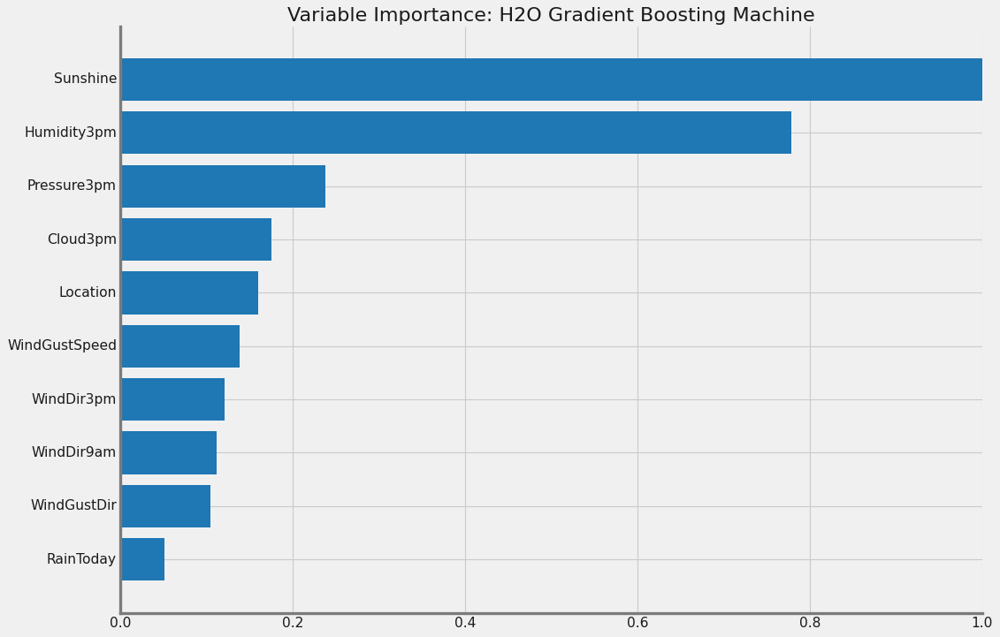

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure(figsize=(5,5))
variable = gbm_default.varimp_plot()
plt.show()

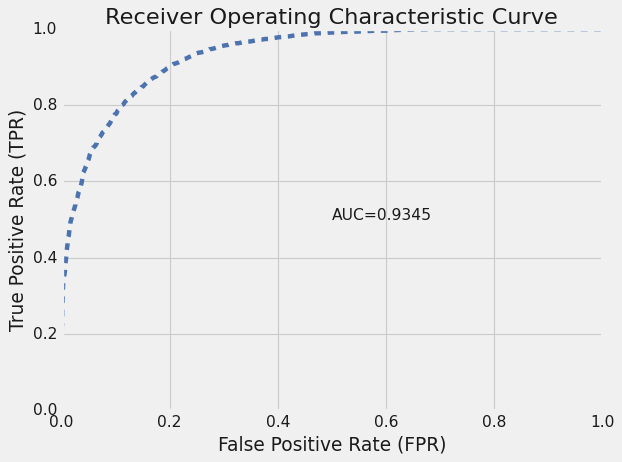

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.00011606313834726091,
  0.00011606313834726091,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00023212627669452182,
  0.00034818941504178273,
  0.00034818941504178273,
  0.00046425255338904364,
  0.00046425255338904364,
  0.00046425255338904364,
  0.00046425255338904364,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0005803156917363045,
  0.0010445682451253482,
  0.0011606

In [ ]:
performace = gbm_default.model_performance(train=True)
performace.plot()

In [ ]:
# Checkeamos la performance en el test dataset
gbm_default.model_performance(weather_test)

ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.1240344997449266
RMSE: 0.3521853201723868
LogLoss: 0.3860886096070867
Mean Per-Class Error: 0.19101604116555188
AUC: 0.8898346000783478
AUCPR: 0.8070428625925494
Gini: 0.7796692001566956

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.27219032604728294
       0     1     Error    Rate
-----  ----  ----  -------  --------------
0      1629  507   0.2374   (507.0/2136.0)
1      148   875   0.1447   (148.0/1023.0)
Total  1777  1382  0.2073   (655.0/3159.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.27219      0.727651  252
max f2                       0.130239     0.8166    318
max f0point5                 0.563953     0.742488  138
max accuracy                 0.482049     0.820829  169
max precision                0.954484     1         0
max recall                   0.0169574    1         393
max specificity              0.954484     1         0
max absolute_mcc             0.27219      0.582917  252
max min_per_class_accuracy   0.330149     0.801564  230
max mean_per_class_accuracy  0.27219      0.808984  252
max tns                      0.954484     2136      0
max fns                      0.954484     1019      0
max fps                      0.00967991   2136      399
max tps                      0.0169574    1023      393
max tnr                      0.954484     1         0
max fnr                      0.954484     0.99609   0
max fpr                      0.00967991   1         399
max tpr                      0.0169574    1         393

Gains/Lift Table: Avg response rate: 32.38 %, avg score: 31.69 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0101298                   0.934982           3.08798    3.08798            1                0.94282    1                           0.94282             0.0312805       0.0312805                  208.798   208.798            0.0312805
2        0.0202596                   0.922511           3.08798    3.08798            1                0.927943   1                           0.935381            0.0312805       0.0625611                  208.798   208.798            0.0625611
3        0.0300728                   0.913702           3.08798    3.08798            1                0.917517   1                           0.929552            0.030303        0.0928641                  208.798   208.798            0.0928641
4        0.0402026                   0.9031             2.89498    3.03935            0.9375           0.908059   0.984252                    0.924136            0.0293255       0.12219                    189.498   203.935            0.121253
5        0.0500158                   0.892427           2.98836    3.02934            0.967742         0.898253   0.981013                    0.919058            0.0293255       0.151515                   198.836   202.934            0.150111
6        0.100032                    0.809999           2.71664    2.87299            0.879747         0.852914   0.93038                     0.885986            0.135875        0.28739                    171.664   187.299            0.27709
7        0.150047                    0.716249           2.26712    2.67103            0.734177         0.762794   0.864979                    0.844922            0.113392        0.400782                   126.712   167.103            0.370819
8        0.200063  

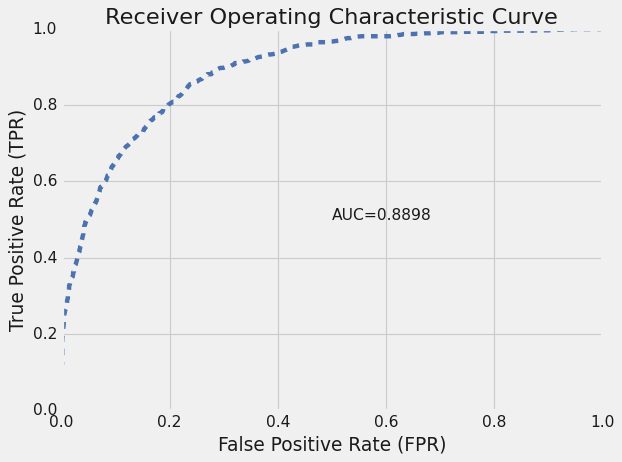

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0009363295880149813,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0014044943820224719,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0023408239700374533,
  0.0028089887640449437,
  0.0028089887640449437,
  0.0028089887640449437,
  0.0032771535580524347,
  0.0032771535580524347,
  0.003745318352059925,
  0.003745318352059925,
  0.004213483146067416,
  0.004213483146067416,
  0.004213483146067416,
  0.005149812734082397,
  0.005149812734082397,
  0.005149812734082397,
  0.006086142322097378,
  0.006554307116104869,
  0.007958801498127341,
  0.008426966292134831,
  0.008426966292134831,
  0.009831460674157303,
  0.010299625468164793,
  0.0102996254

In [ ]:
performace = gbm_default.model_performance(weather_test)
performace.plot()

In [ ]:
# Usamos el  GBM para hacer predicciones
yhat_test_gbm = gbm_default.predict(weather_test)
yhat_test_gbm.head(5)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict,p0,p1
0,0.93601,0.0639901
0,0.972734,0.027266
0,0.981941,0.0180587
0,0.88432,0.11568
0,0.953855,0.046145


# H2ODeepLearningEstimator 

In [ ]:
from h2o.estimators.deeplearning import H2ODeepLearningEstimator

In [ ]:
# Seteamos DNN para regression
dnn_default = H2ODeepLearningEstimator(model_id = 'dnn_default', keep_cross_validation_predictions = True, nfolds =5,fold_assignment='stratified', balance_classes=True)


In [ ]:

# Usamos .train() para hacer el modelo
dnn_default.train(x = features, 
                  y = 'RainTomorrow', 
                  training_frame = weather_train)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ODeepLearningEstimator : Deep Learning
Model Key: dnn_default


Status of Neuron Layers: predicting RainTomorrow, 2-class classification, bernoulli distribution, CrossEntropy loss, 57,602 weights/biases, 686.5 KB, 182,815 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate            rate_rms             momentum    mean_weight            weight_rms           mean_bias               bias_rms
--  -------  -------  ---------  ---------  ----  ----  -------------------  -------------------  ----------  ---------------------  -------------------  ----------------------  -------------------
    1        84       Input      0.0
    2        200      Rectifier  0.0        0.0   0.0   0.06200867744750472  0.23375731706619263  0.0         -0.017117166080107337  0.10100045800209045  0.02394237270462388     0.08930093050003052
    3        200      Rectifier  0.0        0.0   0.0   0.0846477915074589   0.11867555975914001  0.0         -0.028993026608429142  0.0948370099067688   0.508770113835202       0.2946796417236328
    4        2        Softmax               0.0   0.0   0.04413704202976078  0.03706340491771698  0.0         0.003521147581122932   0.37622547149658203  0.00018774123401081588  0.17100369930267334

ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.36044101880974916
RMSE: 0.6003674031872059
LogLoss: 2.000603704525632
Mean Per-Class Error: 0.10535068211510974
AUC: 0.9419274103380064
AUCPR: 0.9098767275809856
Gini: 0.8838548206760128

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9996900959030527
       0     1     Error    Rate
-----  ----  ----  -------  ---------------
0      4196  704   0.1437   (704.0/4900.0)
1      334   4649  0.067    (334.0/4983.0)
Total  4530  5353  0.105    (1038.0/9883.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.99969      0.899574  2
max f2                       0.998355     0.931689  7
max f0point5                 0.999922     0.910089  1
max accuracy                 0.999922     0.900334  1
max precision                0.999986     0.91998   0
max recall                   0.695723     1         164
max specificity              0.999986     0.934286  0
max absolute_mcc             0.999922     0.801344  1
max min_per_class_accuracy   0.999922     0.881597  1
max mean_per_class_accuracy  0.999922     0.900493  1
max tns                      0.999986     4578      0
max fns                      0.999986     1281      0
max fps                      0.000538323  4900      399
max tps                      0.695723     4983      164
max tnr                      0.999986     0.934286  0
max fnr                      0.999986     0.257074  0
max fpr                      0.000538323  1         399
max tpr                      0.695723     1         164

Gains/Lift Table: Avg response rate: 50.42 %, avg score: 89.49 %
group    cumulative_data_fraction    lower_threshold    lift        cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ----------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100172                   1                  1.98334     1.98334            1                1         1                           1                   0.0198675       0.0198675                  98.3343   98.3343            0.0198675
2        0.0201356                   1                  1.98334     1.98334            1                1         1                           1                   0.0200682      

In [ ]:
dnn_default

Model Details
=============
H2ODeepLearningEstimator : Deep Learning
Model Key: dnn_default


Status of Neuron Layers: predicting RainTomorrow, 2-class classification, bernoulli distribution, CrossEntropy loss, 57,602 weights/biases, 686.5 KB, 182,815 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate            rate_rms             momentum    mean_weight            weight_rms           mean_bias               bias_rms
--  -------  -------  ---------  ---------  ----  ----  -------------------  -------------------  ----------  ---------------------  -------------------  ----------------------  -------------------
    1        84       Input      0.0
    2        200      Rectifier  0.0        0.0   0.0   0.06200867744750472  0.23375731706619263  0.0         -0.017117166080107337  0.10100045800209045  0.02394237270462388     0.08930093050003052
    3        200      Rectifier  0.0        0.0   0.0   0.0846477915074589   0.11867555975914001  0.0         -0.028993026608429142  0.0948370099067688   0.508770113835202       0.2946796417236328
    4        2        Softmax               0.0   0.0   0.04413704202976078  0.03706340491771698  0.0         0.003521147581122932   0.37622547149658203  0.00018774123401081588  0.17100369930267334

ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.36044101880974916
RMSE: 0.6003674031872059
LogLoss: 2.000603704525632
Mean Per-Class Error: 0.10535068211510974
AUC: 0.9419274103380064
AUCPR: 0.9098767275809856
Gini: 0.8838548206760128

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9996900959030527
       0     1     Error    Rate
-----  ----  ----  -------  ---------------
0      4196  704   0.1437   (704.0/4900.0)
1      334   4649  0.067    (334.0/4983.0)
Total  4530  5353  0.105    (1038.0/9883.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.99969      0.899574  2
max f2                       0.998355     0.931689  7
max f0point5                 0.999922     0.910089  1
max accuracy                 0.999922     0.900334  1
max precision                0.999986     0.91998   0
max recall                   0.695723     1         164
max specificity              0.999986     0.934286  0
max absolute_mcc             0.999922     0.801344  1
max min_per_class_accuracy   0.999922     0.881597  1
max mean_per_class_accuracy  0.999922     0.900493  1
max tns                      0.999986     4578      0
max fns                      0.999986     1281      0
max fps                      0.000538323  4900      399
max tps                      0.695723     4983      164
max tnr                      0.999986     0.934286  0
max fnr                      0.999986     0.257074  0
max fpr                      0.000538323  1         399
max tpr                      0.695723     1         164

Gains/Lift Table: Avg response rate: 50.42 %, avg score: 89.49 %
group    cumulative_data_fraction    lower_threshold    lift        cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ----------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100172                   1                  1.98334     1.98334            1                1         1                           1                   0.0198675       0.0198675                  98.3343   98.3343            0.0198675
2        0.0201356                   1                  1.98334     1.98334            1                1         1                           1                   0.0200682      

<Figure size 400x400 with 0 Axes>

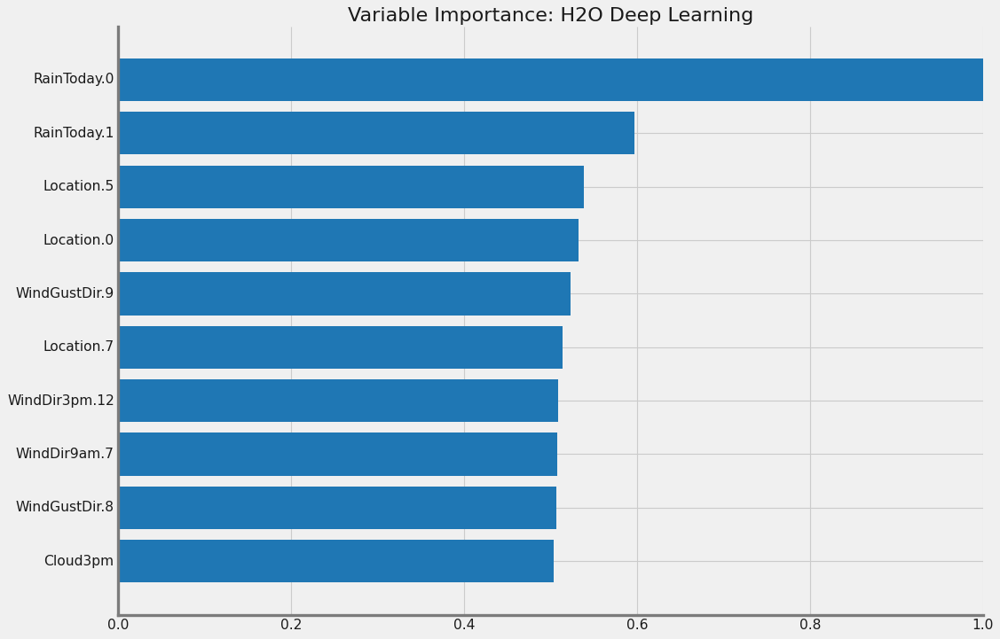

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure(figsize=(5,5))
variable = dnn_default.varimp_plot()
plt.show()

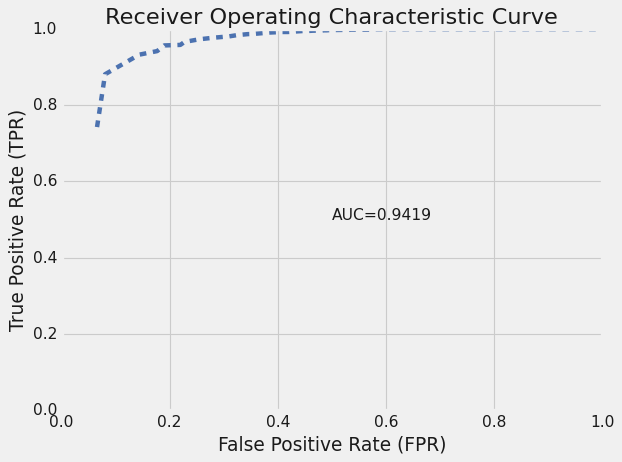

([0.06571428571428571,
  0.08061224489795918,
  0.1436734693877551,
  0.1769387755102041,
  0.18979591836734694,
  0.21979591836734694,
  0.22755102040816327,
  0.2542857142857143,
  0.2810204081632653,
  0.2973469387755102,
  0.3104081632653061,
  0.32387755102040816,
  0.34448979591836737,
  0.3538775510204082,
  0.36551020408163265,
  0.3757142857142857,
  0.38571428571428573,
  0.39653061224489794,
  0.4085714285714286,
  0.41877551020408166,
  0.4287755102040816,
  0.43816326530612243,
  0.44326530612244897,
  0.4493877551020408,
  0.4577551020408163,
  0.46510204081632656,
  0.47306122448979593,
  0.48244897959183675,
  0.48551020408163265,
  0.49081632653061225,
  0.4963265306122449,
  0.5002040816326531,
  0.5048979591836734,
  0.5112244897959184,
  0.5153061224489796,
  0.5183673469387755,
  0.5210204081632653,
  0.5246938775510204,
  0.5293877551020408,
  0.5320408163265307,
  0.5355102040816326,
  0.5385714285714286,
  0.5440816326530612,
  0.5495918367346939,
  0.5551020408

In [ ]:
performace = dnn_default.model_performance(train=True)
performace.plot()

In [ ]:
#Chequeamos la performance en el test
dnn_default.model_performance(weather_test)

ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.5005312503802133
RMSE: 0.7074823322035776
LogLoss: 3.150892671017886
Mean Per-Class Error: 0.21110593978933956
AUC: 0.8440224096711955
AUCPR: 0.6512215261927639
Gini: 0.6880448193423909

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9990407148046883
       0     1     Error    Rate
-----  ----  ----  -------  --------------
0      1539  597   0.2795   (597.0/2136.0)
1      146   877   0.1427   (146.0/1023.0)
Total  1685  1474  0.2352   (743.0/3159.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.999041     0.702443  5
max f2                       0.992293     0.797005  22
max f0point5                 0.999983     0.67206   0
max accuracy                 0.999863     0.786641  1
max precision                0.999983     0.689922  0
max recall                   0.199319     1         321
max specificity              0.999983     0.868914  0
max absolute_mcc             0.999041     0.541949  5
max min_per_class_accuracy   0.999706     0.775171  2
max mean_per_class_accuracy  0.99873      0.788928  6
max tns                      0.999983     1856      0
max fns                      0.999983     400       0
max fps                      0.000374046  2136      399
max tps                      0.199319     1023      321
max tnr                      0.999983     0.868914  0
max fnr                      0.999983     0.391007  0
max fpr                      0.000374046  1         399
max tpr                      0.199319     1         321

Gains/Lift Table: Avg response rate: 32.38 %, avg score: 86.02 %
group    cumulative_data_fraction    lower_threshold    lift        cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ----------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0101298                   1                  2.99148     2.99148            0.96875          1         0.96875                     1                   0.030303        0.030303                   199.148   199.148            0.0298349
2        0.0202596                   1                  2.79848     2.89498            0.90625          1         0.9375                      1                   0.028348        0.058651                   179.848   189.498            0.0567784
3        0.0300728                   1                  2.78914     2.86044            0.903226         1         0.926316                    1                   0.0273705       0.0860215                  178.914   186.044            0.0827444
4        0.0402026                   1                  3.08798     2.91777            1                1         0.944882                    1                   0.0312805       0.117302                   208.798   191.777            0.114025
5        0.0500158                   1                  2.4903      2.8339             0.806452         1         0.917722                    1                   0.0244379       0.14174                    149.03    183.39             0.135654
6        0.100032                    0.999998           2.46256     2.64823            0.797468         0.999999  0.857595                    0.999999            0.123167        0.264907                   146.256   164.823            0.24384
7        0.150047                    0.999993           2.38439     2.56028            0.772152         0.999996  0.829114                    0.999998            0.119257        0.384164                   138.439   156.028            0.346243
8        0.200063        

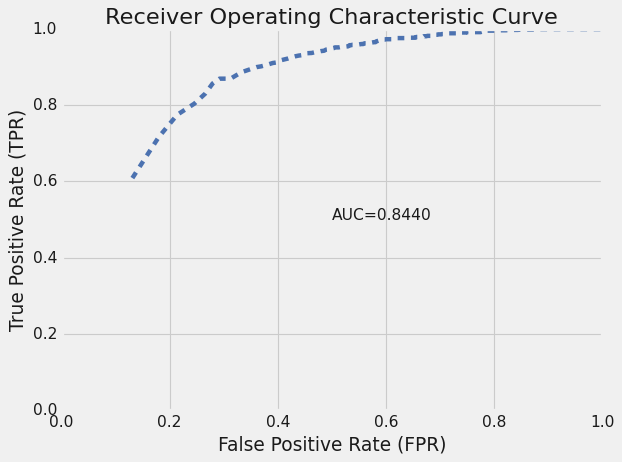

([0.13108614232209737,
  0.1797752808988764,
  0.21395131086142322,
  0.24578651685393257,
  0.26591760299625467,
  0.2794943820224719,
  0.29213483146067415,
  0.31273408239700373,
  0.32303370786516855,
  0.3342696629213483,
  0.3464419475655431,
  0.3604868913857678,
  0.36891385767790263,
  0.3796816479400749,
  0.3904494382022472,
  0.399812734082397,
  0.40730337078651685,
  0.41853932584269665,
  0.42696629213483145,
  0.43211610486891383,
  0.4386704119850187,
  0.4438202247191011,
  0.449438202247191,
  0.46254681647940077,
  0.46863295880149813,
  0.47331460674157305,
  0.4794007490636704,
  0.4854868913857678,
  0.4892322097378277,
  0.4953183520599251,
  0.5,
  0.5032771535580525,
  0.5056179775280899,
  0.5126404494382022,
  0.5159176029962547,
  0.5187265917602997,
  0.5224719101123596,
  0.5252808988764045,
  0.5304307116104869,
  0.5327715355805244,
  0.5360486891385767,
  0.5379213483146067,
  0.5411985018726592,
  0.5440074906367042,
  0.5468164794007491,
  0.55056179

In [ ]:
performace = dnn_default.model_performance(weather_test)
performace.plot()

In [ ]:
# Usamos DNN para predicciones
yhat_test_dnn = dnn_default.predict(weather_test)
yhat_test_dnn.head(5)

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


predict,p0,p1
0,0.00256819,0.997432
0,0.0275193,0.972481
0,0.990508,0.00949152
0,0.537295,0.462705
0,0.977579,0.0224207


# H2OStackedEnsembleEstimator

Crea un método de aprendizaje automático de conjunto apilado (también conocido como "superlearner") que utiliza dos o más algoritmos de aprendizaje H2O para mejorar el rendimiento predictivo. Es un método de aprendizaje supervisado basado en pérdidas que encuentra la combinación óptima de una colección de algoritmos de predicción. Este método admite regresión y clasificación binaria.

In [ ]:
# Importamos la funcion para StackedEnsemble
from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator

In [ ]:

# Seteamos Stacked Ensemble
ensemble = H2OStackedEnsembleEstimator(model_id = "my_ensemble", base_models = [glm_default, drf_default, gbm_default, dnn_default])

# usamos .train para empezar
# GLM para el  metalearner
ensemble.train(x = features, 
               y = 'RainTomorrow', 
               training_frame = weather_train)

stackedensemble Model Build progress: |██████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/4
# GBM base models (used / total),1/1
# GLM base models (used / total),1/1
# DRF base models (used / total),1/1
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,AUTO
Metalearner nfolds,0
Metalearner fold_column,None


In [ ]:

ensemble

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/4
# GBM base models (used / total),1/1
# GLM base models (used / total),1/1
# DRF base models (used / total),1/1
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,AUTO
Metalearner nfolds,0
Metalearner fold_column,None


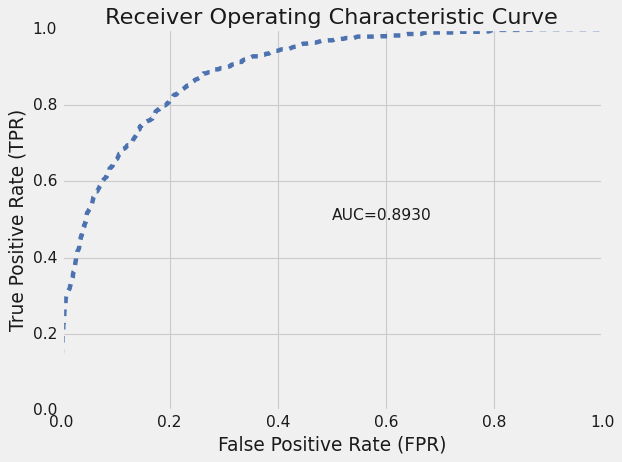

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.00046816479400749064,
  0.00046816479400749064,
  0.00046816479400749064,
  0.00046816479400749064,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0009363295880149813,
  0.0014044943820224719,
  0.0018726591760299626,
  0.0018726591760299626,
  0.0023408239700374533,
  0.0028089887640449437,
  0.0028089887640449437,
  0.0032771535580524347,
  0.0032771535580524347,
  0.0032771535580524347,
  0.004213483146067416,
  0.0046816479400749065,
  0.0046816479400749065,
  0.005149812734082397,
  0.005149812734082397,
  0.005149812734082397,
  0.0056179775280898875,
  0.0056179775280898875,
  0.0056179775280898875,
  0.006086142322097378,
  0.00749063670411985,
  0.00749063670411985,
  0.00749063670411985,
  0.008426966292134831,
  0.008895131086142321,
  0.009831460674157303,
  0.010299625468164793,
  0.012172284644194757,
  0.013108614232209739,
  0.01544943820224719,
  0.015917602996254682,


In [ ]:
performace = ensemble.model_performance(weather_test)
performace.plot()

In [ ]:
# Usamos Stacked Ensemble para predicciones
yhat_test_ensemble = ensemble.predict(weather_test)
yhat_test_ensemble.head(5)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


predict,p0,p1
0,0.906641,0.0933587
0,0.9355,0.0645
0,0.998868,0.00113214
0,0.987471,0.0125292
0,0.998483,0.00151687



Comparación del rendimiento del modelo en datos de prueba

In [ ]:
print('Modelo GLM  (AUC) : ', glm_default.model_performance(weather_test).auc())
print('Modelo DRF (AUC) : ', drf_default.model_performance(weather_test).auc())
print('Modelo GBM  (AUC) : ', gbm_default.model_performance(weather_test).auc())
print('Modelo DNN  (AUC) : ', dnn_default.model_performance(weather_test).auc())
print('Modelo Stacked Ensembles (AUC) : ', ensemble.model_performance(weather_test).auc())

Modelo GLM  (AUC) :  0.8831313314368768
Modelo DRF (AUC) :  0.8865791843772997
Modelo GBM  (AUC) :  0.8898346000783478
Modelo DNN  (AUC) :  0.8440224096711955
Modelo Stacked Ensembles (AUC) :  0.893041277215797


# **Conclusion**

- Después de lidiar con los valores faltantes en el conjunto de datos y un extenso análisis de las features. Llegamos a saber más acerca de cómo las features se correlacionan entre sí.
- Implementamos el MICE imputer para lidiar con los valores faltantes de las variables numericas
- Implementamos las técnicas BorderlineSMOTE y RandomUnderSampler en nuestras funciones para lidiar con los datos desequilibrados.
- Luego, utilizamos diferentes modelos de clasificación de H2O para ver cómo funciona en el conjunto de datos. Obtuvimos resultados bastante buenos con AUC, precisión y puntaje de recuperación.
- llegamos a la conclusión de que el modelo Stacked Ensembles es el que mejor se adapta a nuestro conjunto de datos. Pero, como usamos parámetros predeterminados para nuestros modelos. Entonces, los otros modelos pudieron ajustarse y mejorar los otros modelos.